# ---------------------------------------- Data Preparation Phase ----------------------------------------

## Import necessary libraries for data preparation

In [ ]:
import os
import shutil
import pandas as pd
import random
from PIL import Image
import matplotlib.pyplot as plt

## Define the base path and categories

In [ ]:
base_path = "/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset"

In [ ]:
categories = {
    "positive": {
        "Respectful": os.path.join(base_path, "positive", "Respectful"),
        "Supportive": os.path.join(base_path, "positive", "Supportive"),
        "Friendly": os.path.join(base_path, "positive", "Friendly"),
    },
    "negative": {
        "Rude": os.path.join(base_path, "negative", "Rude"),
        "Dismissive": os.path.join(base_path, "negative", "Dismissive"),
        "Hostile": os.path.join(base_path, "negative", "Hostile"),
    },
    "neutral": {
        "Neutral": os.path.join(base_path, "neutral", "neutral"),
    }
}

## Specify the target directory for copied images

In [ ]:
target_directory = "/content/drive/MyDrive/Images-Social-Demeanor/dataset"
os.makedirs(target_directory, exist_ok=True)

## Prepare a list to hold the renamed image data

In [ ]:
image_data = []

## Display dataset images

In [ ]:
def visualize_images_from_main_directory(directory_path, grid_size=(2, 5), image_size=(200, 200)):
    """
    Visualizes images from a main directory (without subdirectories) and labels them with the directory name.

    :param directory_path: Path to the main directory containing images.
    :param grid_size: Tuple representing the grid size (rows, columns).
    :param image_size: Tuple representing the size of each image in pixels (width, height).
    """
    image_paths = []
    label = os.path.basename(directory_path)  # Use the main directory name as the label

    print(f"Scanning directory: {directory_path}")
    if not os.path.exists(directory_path):
        print(f"Directory does not exist: {directory_path}")
        return

    # Collect all image paths
    for filename in os.listdir(directory_path):
        if filename.lower().endswith(('.jpg', '.jpeg', '.png')):  # Add more extensions if needed
            image_paths.append(os.path.join(directory_path, filename))

    print(f"Found {len(image_paths)} images.")

    if not image_paths:
        print("No images found in the directory.")
        return

    # Randomly select images if more than the grid size
    num_images = grid_size[0] * grid_size[1]
    if len(image_paths) > num_images:
        image_paths = random.sample(image_paths, num_images)

    # Display the images in a grid
    fig, axes = plt.subplots(grid_size[0], grid_size[1], figsize=(grid_size[1] * 3, grid_size[0] * 3))
    axes = axes.flatten()

    for ax, img_path in zip(axes, image_paths):
        try:
            img = Image.open(img_path)  # Correctly open the image
            img = img.resize(image_size)  # Resize the image
            ax.imshow(img)
            ax.axis('off')  # Remove axis ticks and labels
            ax.set_title(label, fontsize=10, color='blue')  # Use the directory name as the label
        except Exception as e:
            print(f"Error loading image: {img_path}, Error: {e}")
            ax.axis('off')  # Skip this axis if image cannot be loaded

    # Hide unused axes
    for ax in axes[len(image_paths):]:
        ax.axis('off')

    plt.tight_layout()
    plt.show()

### Dismissive

Scanning directory: /content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/negative/Dismissive
Found 729 images.


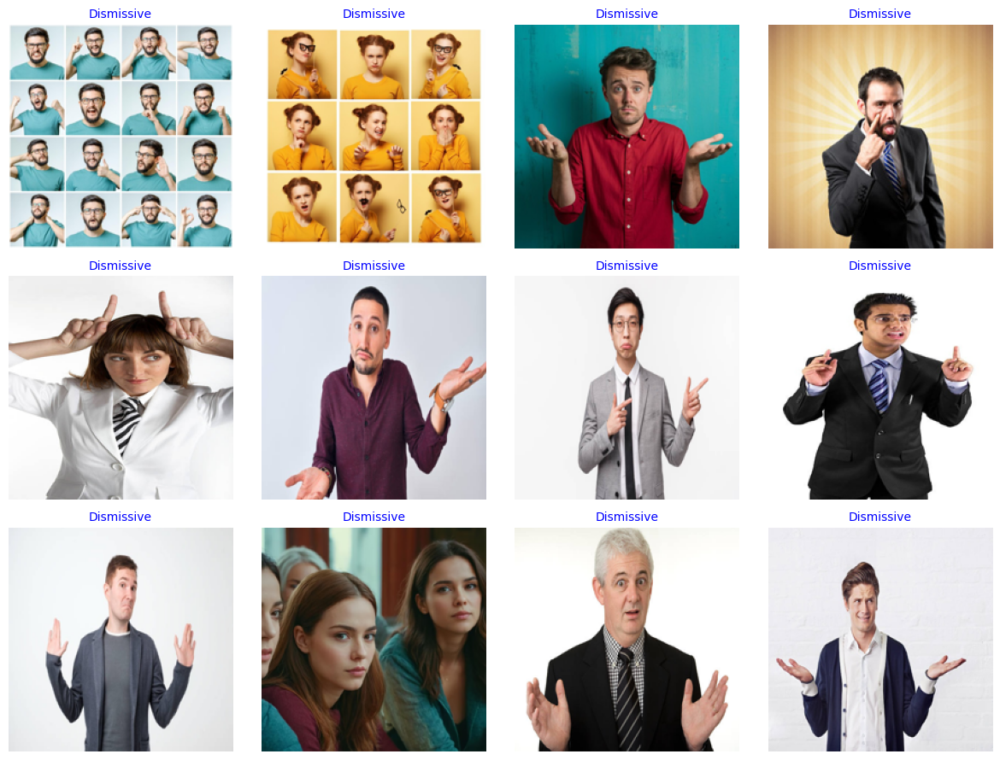

In [ ]:
main_directory = '/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/negative/Dismissive'
visualize_images_from_main_directory(main_directory, grid_size=(3, 4), image_size=(200, 200))

### Hostile

Scanning directory: /content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/negative/Hostile
Found 697 images.


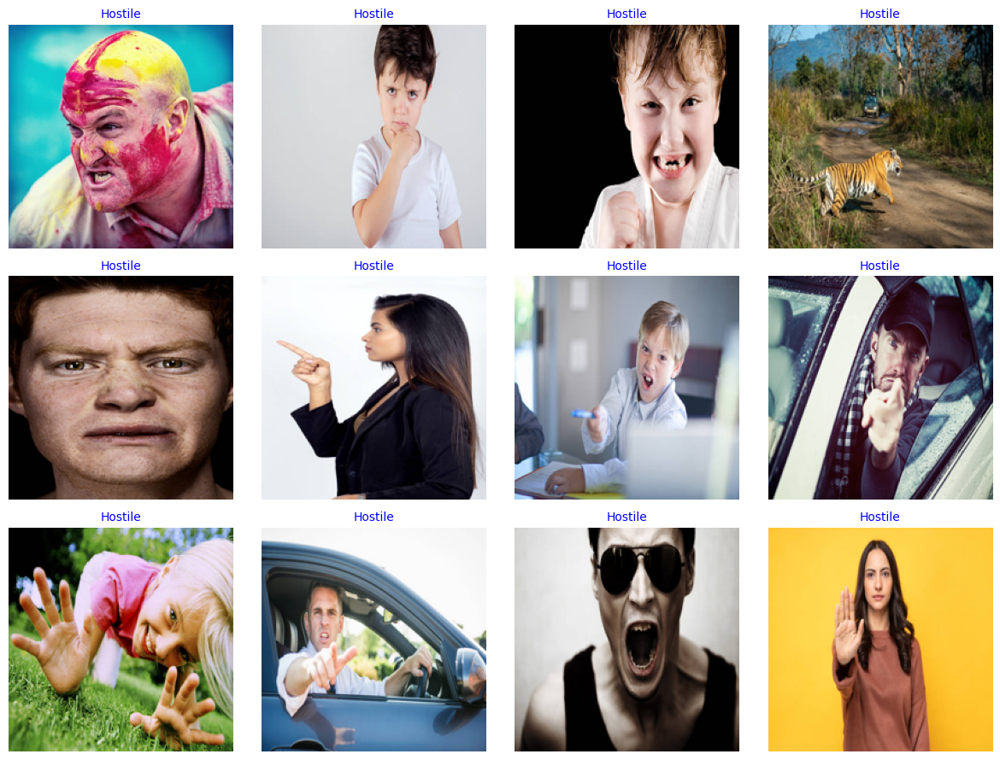

In [ ]:
main_directory = '/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/negative/Hostile'
visualize_images_from_main_directory(main_directory, grid_size=(3, 4), image_size=(200, 200))

### Rude

Scanning directory: /content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/negative/Rude
Found 694 images.


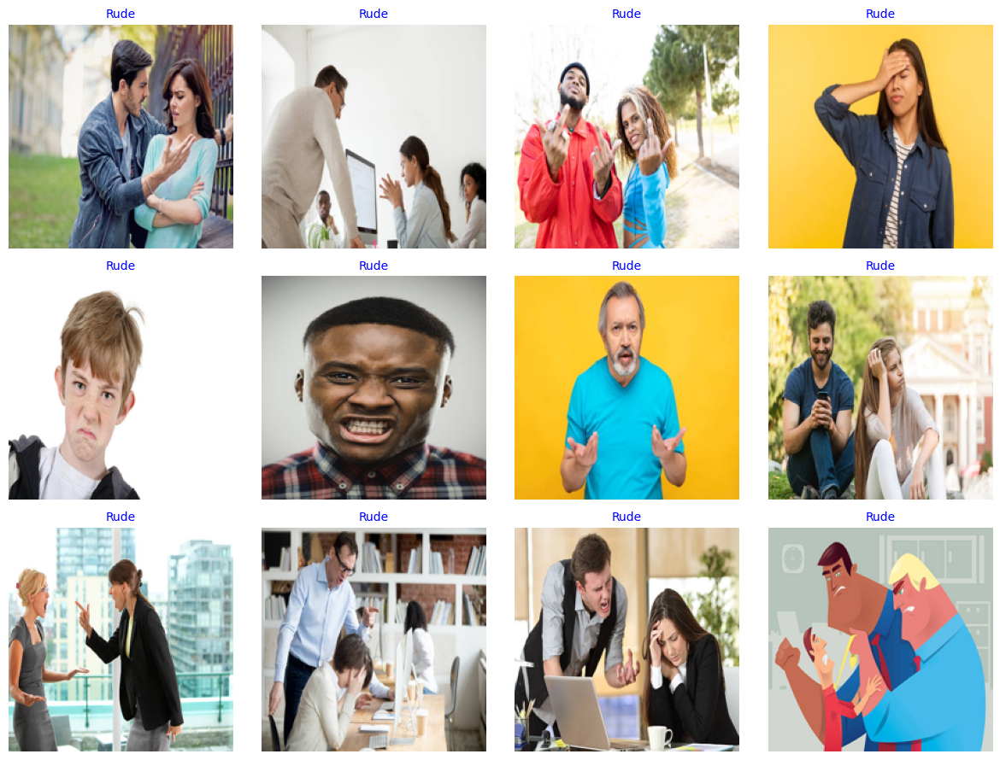

In [ ]:
main_directory = '/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/negative/Rude'
visualize_images_from_main_directory(main_directory, grid_size=(3, 4), image_size=(200, 200))

### Friendly

Scanning directory: /content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/positive/Friendly
Found 713 images.


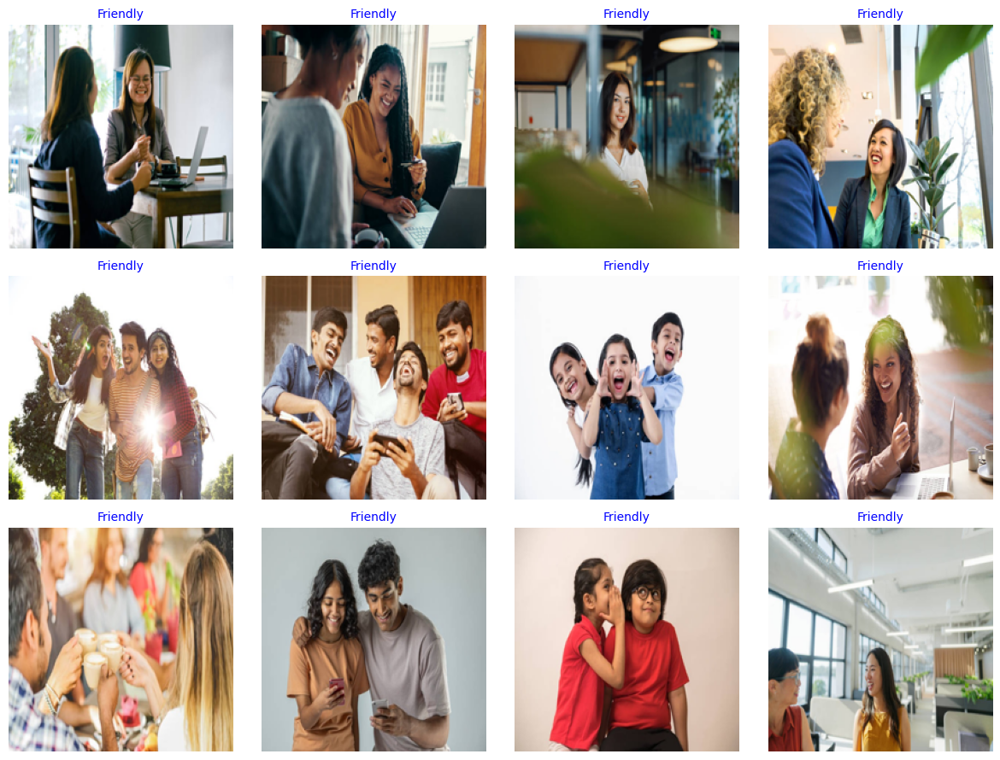

In [ ]:
main_directory = '/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/positive/Friendly'
visualize_images_from_main_directory(main_directory, grid_size=(3, 4), image_size=(200, 200))

### Respectful

Scanning directory: /content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/positive/Respectful
Found 693 images.


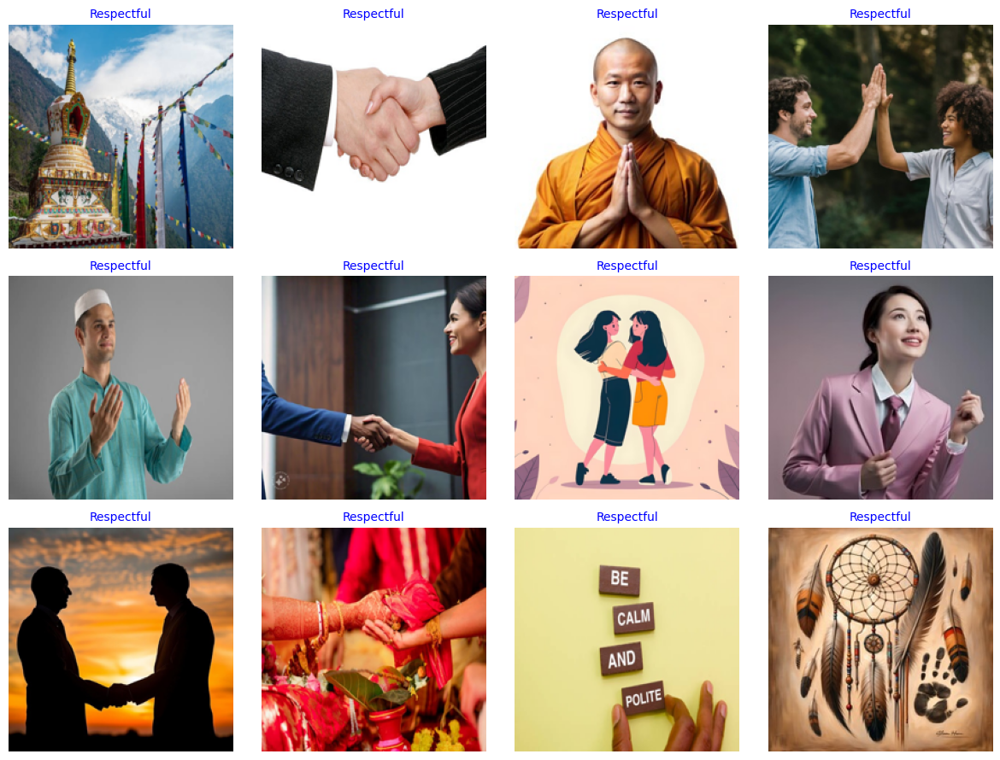

In [ ]:
main_directory = '/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/positive/Respectful'
visualize_images_from_main_directory(main_directory, grid_size=(3, 4), image_size=(200, 200))

### Supportive

Scanning directory: /content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/positive/Supportive
Found 715 images.


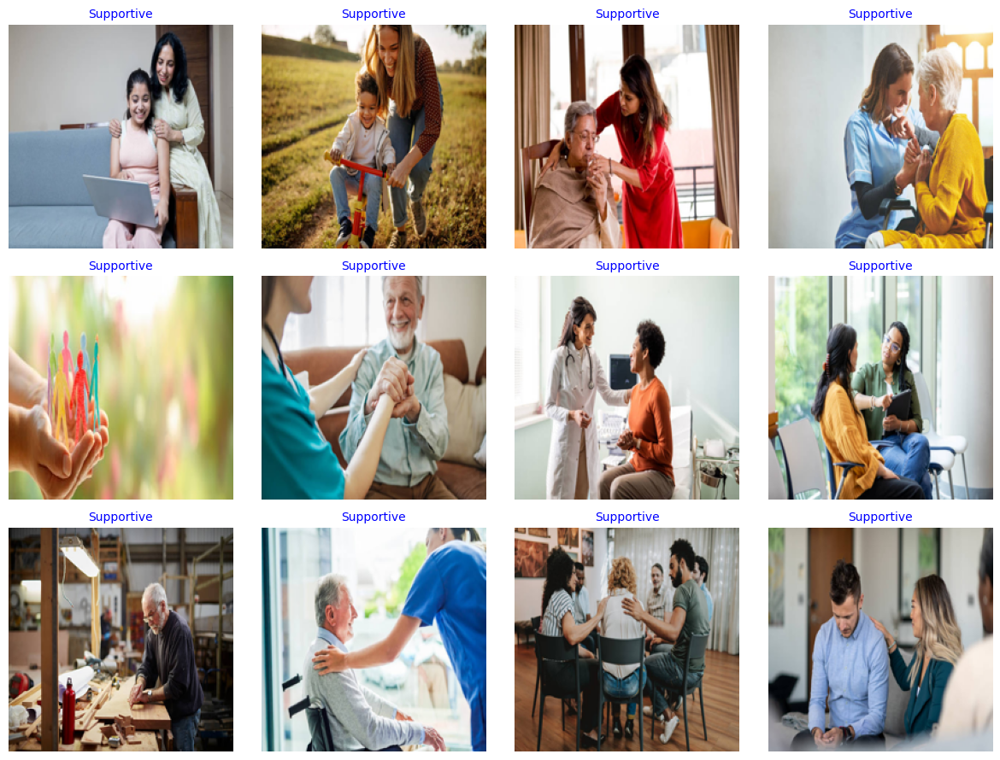

In [ ]:
main_directory = '/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/positive/Supportive'
visualize_images_from_main_directory(main_directory, grid_size=(3, 4), image_size=(200, 200))

### Neutral

Scanning directory: /content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/neutral/neutral
Found 778 images.


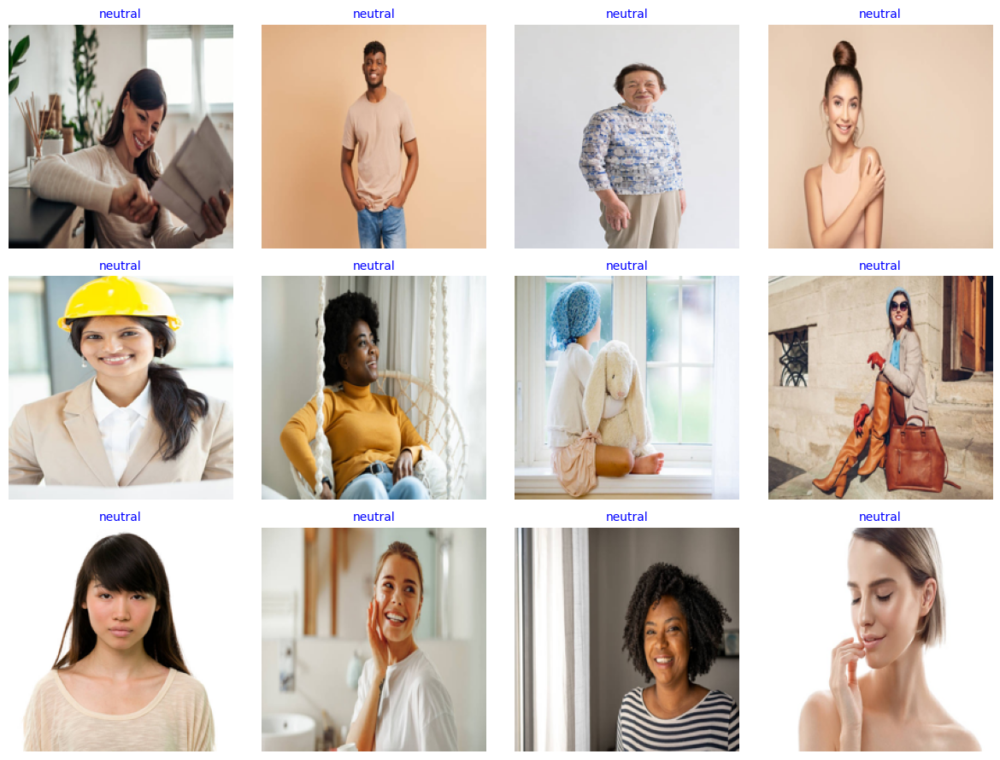

In [ ]:
main_directory = '/content/drive/MyDrive/Images-Social-Demeanor/Images-dataset/neutral/neutral'
visualize_images_from_main_directory(main_directory, grid_size=(3, 4), image_size=(200, 200))

## Rename images, copy to target directory, and create CSV data

In [ ]:
for sentiment, social_demeanors in categories.items():
    for social_demeanor, dir_path in social_demeanors.items():
        if not os.path.exists(dir_path):
            print(f"Directory not found: {dir_path}")
            continue

        images = os.listdir(dir_path)
        for i, image_name in enumerate(images):
            new_image_name = f"{social_demeanor.lower()}-{i + 1}.jpg"
            new_image_path = os.path.join(target_directory, new_image_name)

            old_image_path = os.path.join(dir_path, image_name)
            shutil.copy(old_image_path, new_image_path)

            image_data.append({
                "image_name": new_image_name,
                "sentiment": sentiment.capitalize(),
                "social_demeanor": social_demeanor
            })

df = pd.DataFrame(image_data)

## Save labels to CSV in the target directory

In [ ]:
csv_file_path = "/content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/labels.csv"
df.to_csv(csv_file_path, index=False)
print(f"Images copied to: {target_directory}")
print(f"CSV file created at: {csv_file_path}")

Images copied to: /content/drive/MyDrive/Images-Social-Demeanor/dataset
CSV file created at: /content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/labels.csv


## ---------------------- Exploratory Data Analysis Phase ----------------------

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
file_path = '/content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/labels.csv'
df = pd.read_csv(file_path)

In [ ]:
sns.set(style="whitegrid")

### Sentiment Distribution

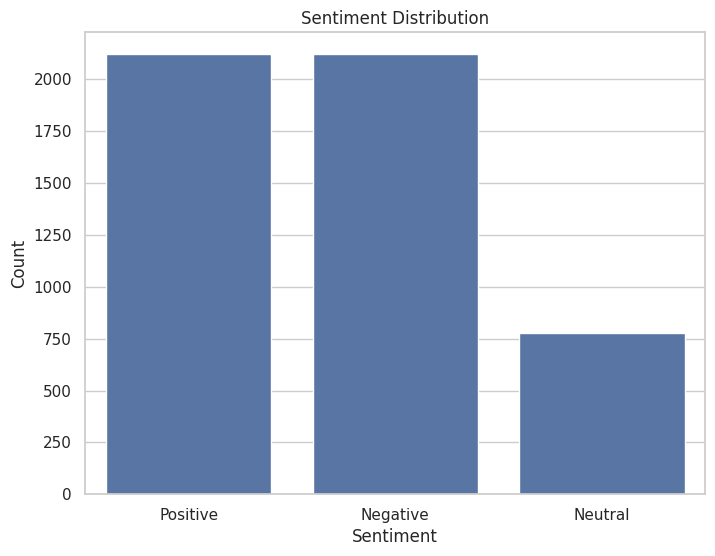

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x="sentiment")
plt.title("Sentiment Distribution")
plt.xlabel("Sentiment")
plt.ylabel("Count")
plt.show()

###  Social Demeanor Distribution

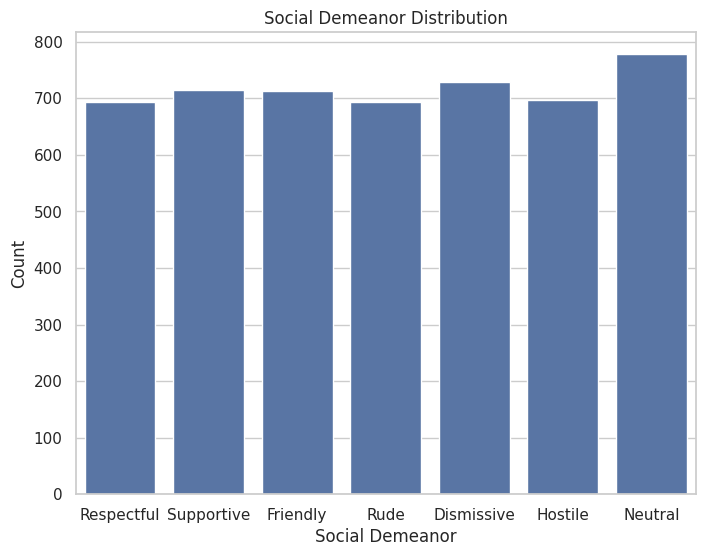

In [ ]:
plt.figure(figsize=(8, 6))
sns.countplot(data=df, x="social_demeanor")
plt.title("Social Demeanor Distribution")
plt.xlabel("Social Demeanor")
plt.ylabel("Count")
plt.show()

### Sentiment vs. Social Demeanor

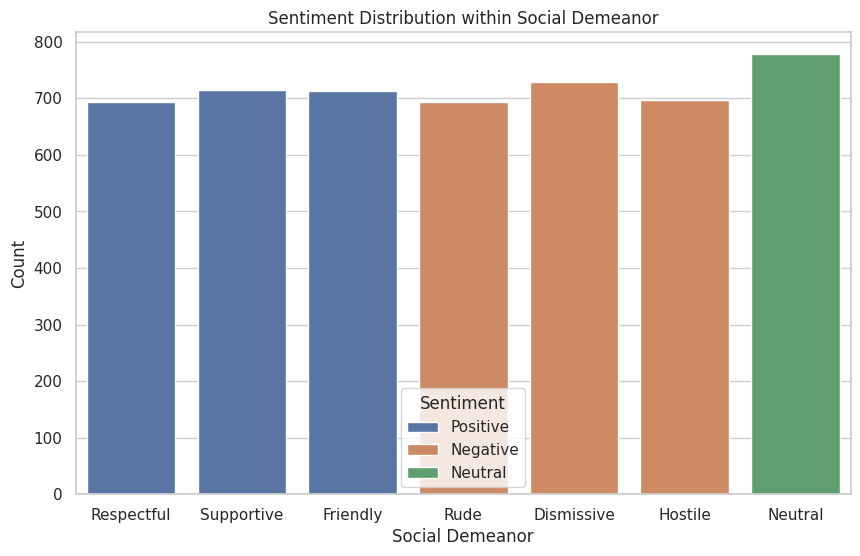

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x="social_demeanor", hue="sentiment")
plt.title("Sentiment Distribution within Social Demeanor")
plt.xlabel("Social Demeanor")
plt.ylabel("Count")
plt.legend(title="Sentiment")
plt.show()

###  Sentiment and Social Demeanor Co-occurrence Matrix

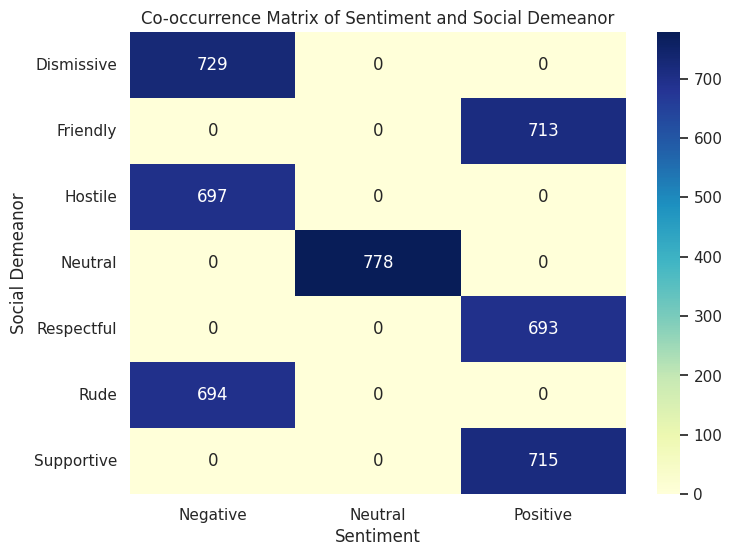

In [ ]:
plt.figure(figsize=(8, 6))
co_occurrence_matrix = pd.crosstab(df['social_demeanor'], df['sentiment'])
sns.heatmap(co_occurrence_matrix, annot=True, fmt="d", cmap="YlGnBu")
plt.title("Co-occurrence Matrix of Sentiment and Social Demeanor")
plt.xlabel("Sentiment")
plt.ylabel("Social Demeanor")
plt.show()

# ---------------------------------------- Feature Extraction Phase ----------------------------------------

In [ ]:
!pip install deepface

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 87.2/87.2 kB 4.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.6/108.6 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.0/85.0 kB 9.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.9/1.9 MB 37.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 72.0 MB/s eta 0:00:00
  Created wheel for fire: filename=fire-0.7.0-py3-none-any.whl size=114249 sha256=dd48b586540ae64b0a8b80370ac69cabc3b2da2bdd3c2ee5e004f4243b27e159
  Stored in directory: /root/.cache/pip/wheels/19/39/2f/2d3cadc408a8804103f1c34ddd4b9f6a93497b11fa96fe738e
Successfully built fire


## Import libraries for image processing and feature extraction

In [ ]:
import numpy as np
import pandas as pd
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input
from deepface import DeepFace
from tqdm import tqdm

24-11-08 17:46:26 - Directory /root/.deepface has been created
24-11-08 17:46:26 - Directory /root/.deepface/weights has been created


## Initialize EfficientNetB0 model

In [ ]:
efficientnet_model = EfficientNetB0(weights="imagenet", include_top=False, pooling='avg')

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [ ]:
def extract_efficientnet_features(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    features = efficientnet_model.predict(img_array)
    return features.flatten()

In [ ]:
def extract_deepface_features(img_path):
    try:
        analysis = DeepFace.analyze(img_path, actions=['emotion'], enforce_detection=False)
        dominant_emotion = analysis[0]['dominant_emotion']
        emotion_score = analysis[0]['emotion'][dominant_emotion]
        return dominant_emotion, emotion_score
    except Exception as e:
        print(f"Error processing facial expression for {img_path}: {e}")
        return None, None

## Process images and extract features

In [ ]:
features_data = []

In [ ]:
for index, row in tqdm(df.iterrows(), total=df.shape[0]):
    img_name = row['image_name']
    img_path = os.path.join(target_directory, img_name)

    effnet_features = extract_efficientnet_features(img_path)
    dominant_emotion, emotion_score = extract_deepface_features(img_path)

    avg_brightness = np.mean(effnet_features)
    color_descriptor = "Bright" if avg_brightness > 0.5 else "Dark"

    feature_dict = {
        "image_name": img_name,
        "dominant_emotion": dominant_emotion,
        "emotion_score": emotion_score,
        "color_descriptor": color_descriptor,
        "avg_brightness": avg_brightness,
        **{f"effnet_feature_{i}": feature for i, feature in enumerate(effnet_features)}
    }

    features_data.append(feature_dict)

## Convert list to DataFrame and save to CSV

In [ ]:
features_df = pd.DataFrame(features_data)
features_csv_path = "/content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/extracted_features.csv"
features_df.to_csv(features_csv_path, index=False)
print(f"Features extracted and saved to: {features_csv_path}")

## ---------------------- Exploratory Data Analysis Phase ----------------------

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.ensemble import RandomForestClassifier
from sklearn.decomposition import PCA
import numpy as np

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
sns.set(style="whitegrid")

In [4]:
file_path = '/content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/extracted_features.csv'
df = pd.read_csv(file_path)

In [5]:
embedding_features = df.filter(like='effnet_feature').values
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(embedding_features)

### EDA using head(), describe(), info()

In [ ]:
df.head()

,image_name,dominant_emotion,emotion_score,color_descriptor,avg_brightness,effnet_feature_0,effnet_feature_1,effnet_feature_2,effnet_feature_3,effnet_feature_4,...,effnet_feature_1270,effnet_feature_1271,effnet_feature_1272,effnet_feature_1273,effnet_feature_1274,effnet_feature_1275,effnet_feature_1276,effnet_feature_1277,effnet_feature_1278,effnet_feature_1279
0,respectful-1.jpg,fear,42.944017,Dark,0.141921,0.231030,0.480867,-0.128490,0.178739,-0.149956,...,-0.094805,-0.097487,0.029058,-0.101270,0.525305,0.031480,-0.041296,-0.066651,-0.144403,0.075048
1,respectful-2.jpg,happy,99.987644,Dark,0.166585,-0.060424,0.485108,0.173747,-0.098214,-0.097689,...,0.197877,-0.135473,0.016607,0.352066,0.065295,0.172940,1.688780,0.238711,-0.108865,0.102636
2,respectful-3.jpg,sad,97.665340,Dark,0.184303,0.445622,0.067298,-0.167476,0.009685,-0.047029,...,0.223469,-0.119213,-0.042100,-0.085292,0.100180,-0.119115,0.178599,0.514279,-0.047832,0.666020
3,respectful-4.jpg,neutral,80.693007,Dark,0.111270,-0.120287,-0.113242,-0.117253,-0.022577,0.029116,...,-0.048430,-0.152053,-0.059604,0.861931,0.020029,-0.053157,-0.150684,-0.134392,0.230609,0.426133
4,respectful-5.jpg,angry,80.698566,Dark,0.146219,-0.081535,-0.094180,-0.101420,-0.128241,-0.123496,...,0.074104,0.025332,0.123625,-0.057946,-0.111634,0.516890,0.550758,0.138921,-0.125240,-0.148273


In [ ]:
df.describe()

,emotion_score,avg_brightness,effnet_feature_0,effnet_feature_1,effnet_feature_2,effnet_feature_3,effnet_feature_4,effnet_feature_5,effnet_feature_6,effnet_feature_7,...,effnet_feature_1270,effnet_feature_1271,effnet_feature_1272,effnet_feature_1273,effnet_feature_1274,effnet_feature_1275,effnet_feature_1276,effnet_feature_1277,effnet_feature_1278,effnet_feature_1279
count,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,...,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000
mean,84.284243,0.121742,-0.015570,0.029694,-0.007897,-0.032325,-0.011063,0.181564,0.102477,-0.020604,...,0.071549,-0.009199,-0.006720,0.064307,0.253690,0.108995,0.365561,0.091575,-0.036407,0.069453
std,18.554291,0.065007,0.223709,0.256939,0.216275,0.164498,0.214336,0.309966,0.291414,0.198913,...,0.287679,0.197789,0.208420,0.287453,0.369771,0.291097,0.410599,0.253817,0.177662,0.315029
min,26.633677,-0.058799,-0.226691,-0.242138,-0.247445,-0.221174,-0.233284,-0.226532,-0.228706,-0.246437,...,-0.223774,-0.235580,-0.224121,-0.249756,-0.237117,-0.247452,-0.195260,-0.242490,-0.225138,-0.244976
25%,71.576607,0.070937,-0.136067,-0.138140,-0.127150,-0.121092,-0.130316,-0.053138,-0.106279,-0.130828,...,-0.111317,-0.123843,-0.105496,-0.128076,-0.023266,-0.092346,0.038744,-0.082737,-0.125196,-0.150304
50%,93.297452,0.123333,-0.097388,-0.062209,-0.085569,-0.086500,-0.092593,0.102845,-0.000671,-0.095990,...,-0.043243,-0.079833,-0.073442,-0.045848,0.160073,0.017108,0.278564,0.009662,-0.094004,-0.048466
75%,99.584150,0.169085,0.012685,0.115067,0.023856,-0.011448,0.018682,0.329305,0.219293,0.007379,...,0.155673,0.036370,-0.001029,0.164381,0.426775,0.216812,0.599517,0.179991,-0.037378,0.185717
max,100.000000,0.343003,2.251738,2.344940,2.115978,1.820003,2.089447,2.269296,2.169681,1.558144,...,2.221228,1.647381,2.316033,2.400591,2.855211,2.636419,2.438466,2.109029,1.539168,2.458257


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5019 entries, 0 to 5018
Columns: 1285 entries, image_name to effnet_feature_1279
dtypes: float64(1282), object(3)
memory usage: 49.2+ MB


###  Emotion Embedding Clustering Analysis (using t-SNE)

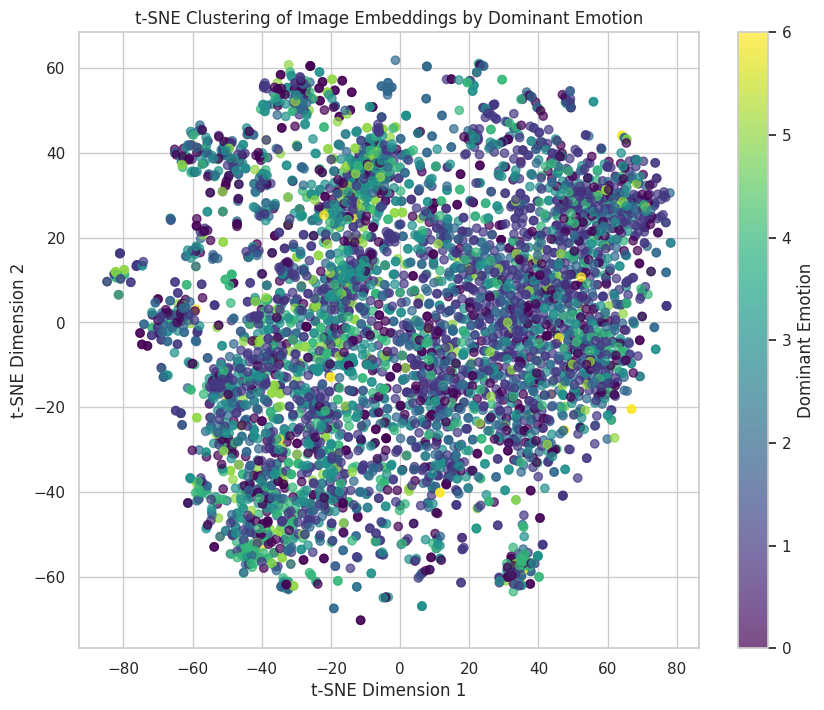

In [ ]:
plt.figure(figsize=(10, 8))
plt.scatter(tsne_results[:, 0], tsne_results[:, 1], c=pd.factorize(df['dominant_emotion'])[0], cmap='viridis', alpha=0.7)
plt.colorbar(ticks=range(len(df['dominant_emotion'].unique())), label='Dominant Emotion')
plt.title("t-SNE Clustering of Image Embeddings by Dominant Emotion")
plt.xlabel("t-SNE Dimension 1")
plt.ylabel("t-SNE Dimension 2")
plt.show()

### Emotion Score Distribution by Dominant Emotion

<ipython-input-233-0cdce034eac9>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.violinplot(data=df, x='dominant_emotion', y='emotion_score', palette='pastel')


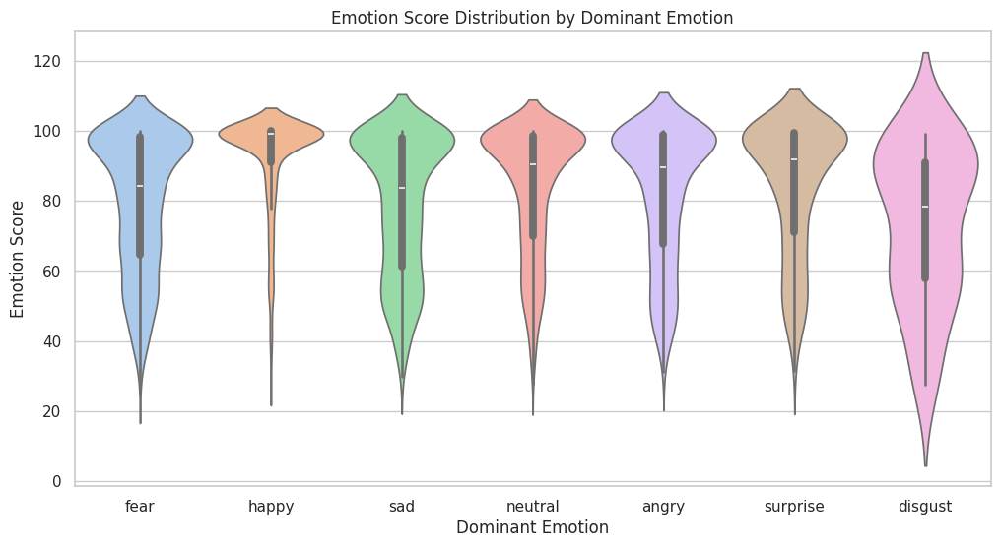

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='dominant_emotion', y='emotion_score', palette='pastel')
plt.title("Emotion Score Distribution by Dominant Emotion")
plt.xlabel("Dominant Emotion")
plt.ylabel("Emotion Score")
plt.show()

###  Feature Importance via Random Forest

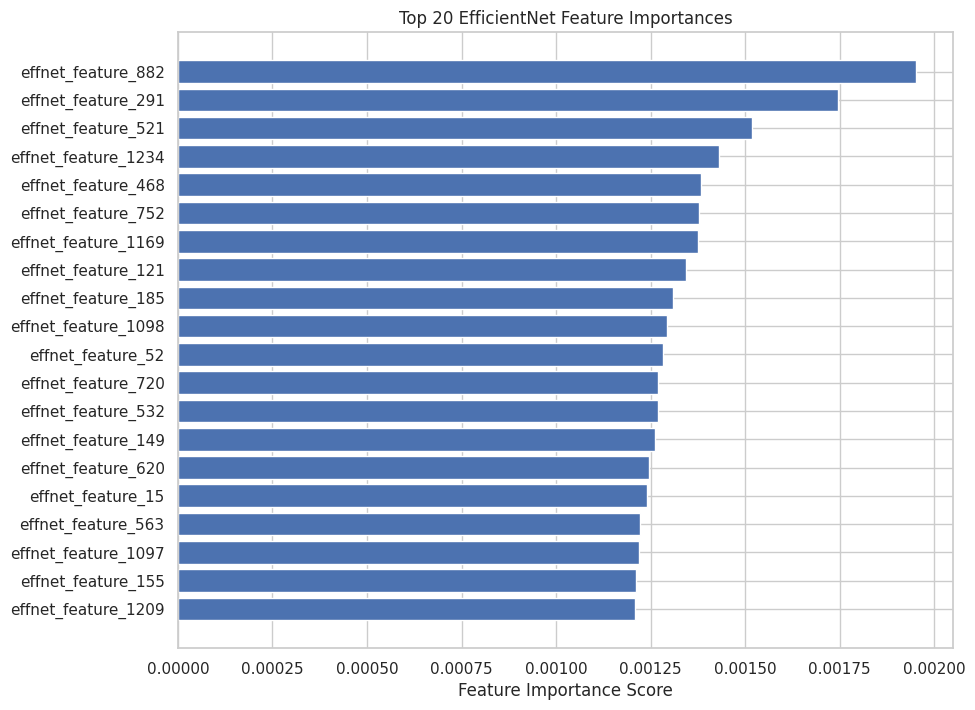

In [ ]:
X = df.filter(like='effnet_feature')
y = pd.factorize(df['dominant_emotion'])[0]
rf = RandomForestClassifier(n_estimators=50, random_state=42)
rf.fit(X, y)
importances = rf.feature_importances_

indices = np.argsort(importances)[-20:]
plt.figure(figsize=(10, 8))
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), [f'effnet_feature_{i}' for i in indices])
plt.title("Top 20 EfficientNet Feature Importances")
plt.xlabel("Feature Importance Score")
plt.show()

### Brightness vs. Emotion Score by Color Descriptor

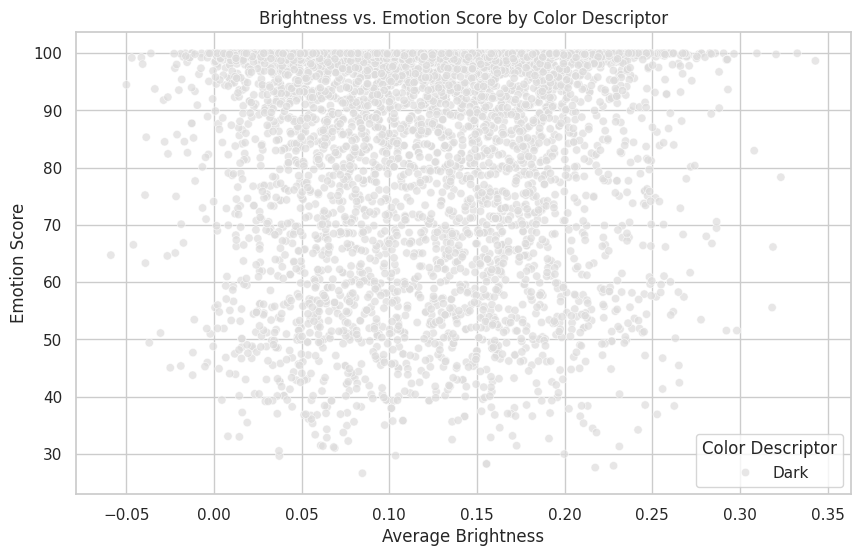

In [ ]:
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df, x='avg_brightness', y='emotion_score', hue='color_descriptor', palette='coolwarm', alpha=0.7)
plt.title("Brightness vs. Emotion Score by Color Descriptor")
plt.xlabel("Average Brightness")
plt.ylabel("Emotion Score")
plt.legend(title="Color Descriptor")
plt.show()

### Heatmap of Emotion Co-occurrences with Color Descriptor

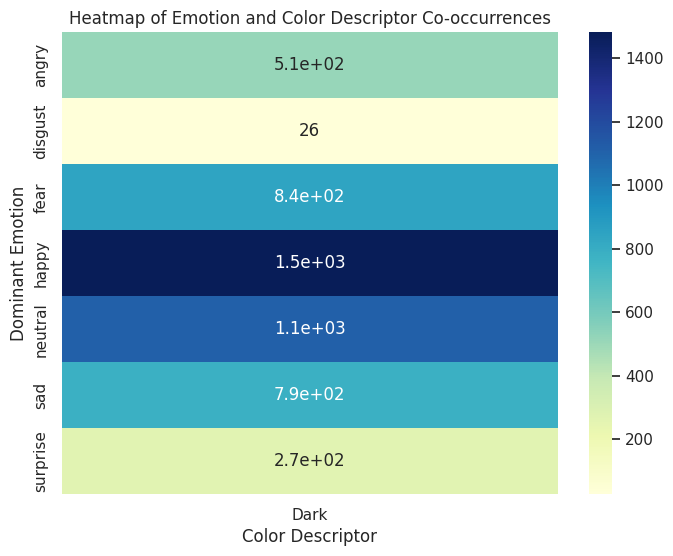

In [ ]:
emotion_color_matrix = pd.crosstab(df['dominant_emotion'], df['color_descriptor'])
plt.figure(figsize=(8, 6))
sns.heatmap(emotion_color_matrix, annot=True, cmap="YlGnBu")
plt.title("Heatmap of Emotion and Color Descriptor Co-occurrences")
plt.xlabel("Color Descriptor")
plt.ylabel("Dominant Emotion")
plt.show()

### Pairwise Correlation Heatmap of EfficientNet Features

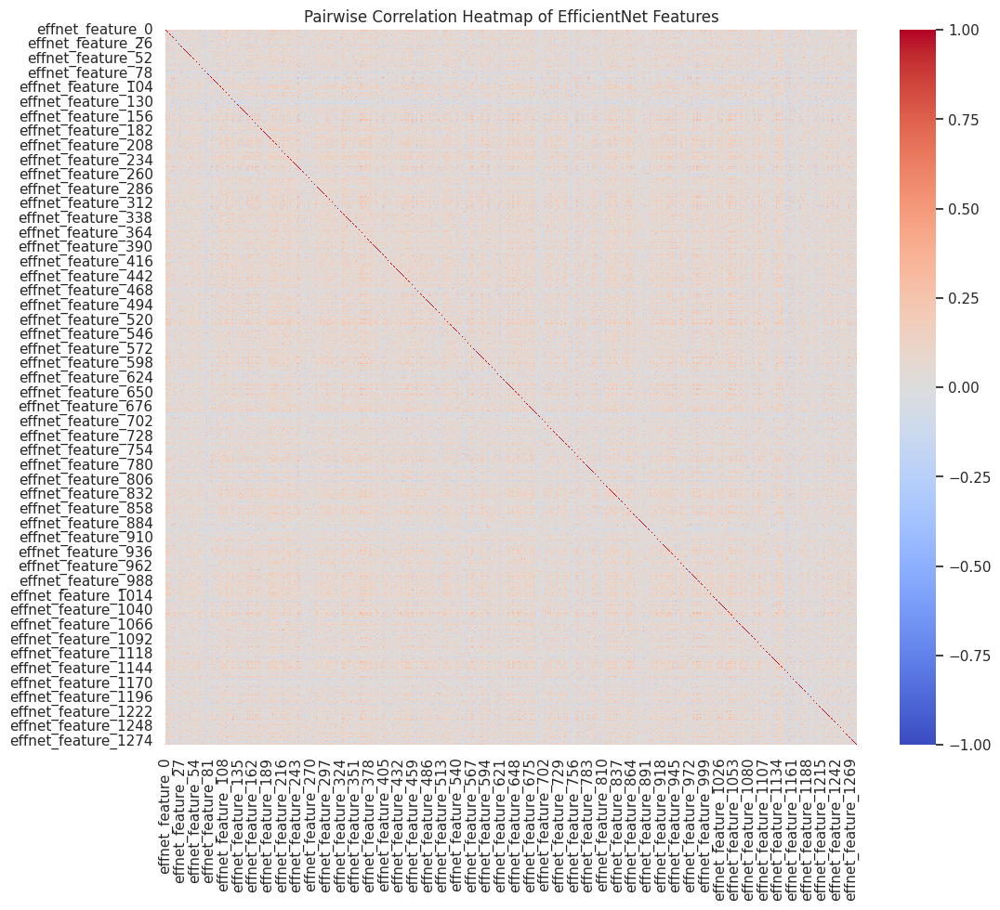

In [ ]:
corr_matrix = df.filter(like='effnet_feature').corr()
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, cmap="coolwarm", vmin=-1, vmax=1)
plt.title("Pairwise Correlation Heatmap of EfficientNet Features")
plt.show()

### Distribution of Dominant Emotions over Brightness Ranges

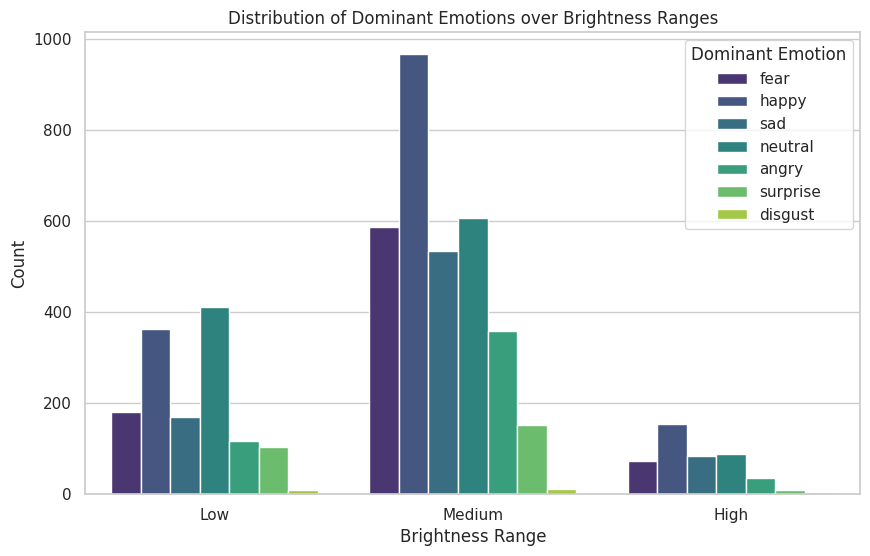

In [ ]:
df['brightness_range'] = pd.cut(df['avg_brightness'], bins=3, labels=["Low", "Medium", "High"])
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='brightness_range', hue='dominant_emotion', palette='viridis')
plt.title("Distribution of Dominant Emotions over Brightness Ranges")
plt.xlabel("Brightness Range")
plt.ylabel("Count")
plt.legend(title="Dominant Emotion")
plt.show()

###  Dimensionality Reduction using PCA on EfficientNet Features

In [ ]:
pca = PCA(n_components=2)
pca_results = pca.fit_transform(X)

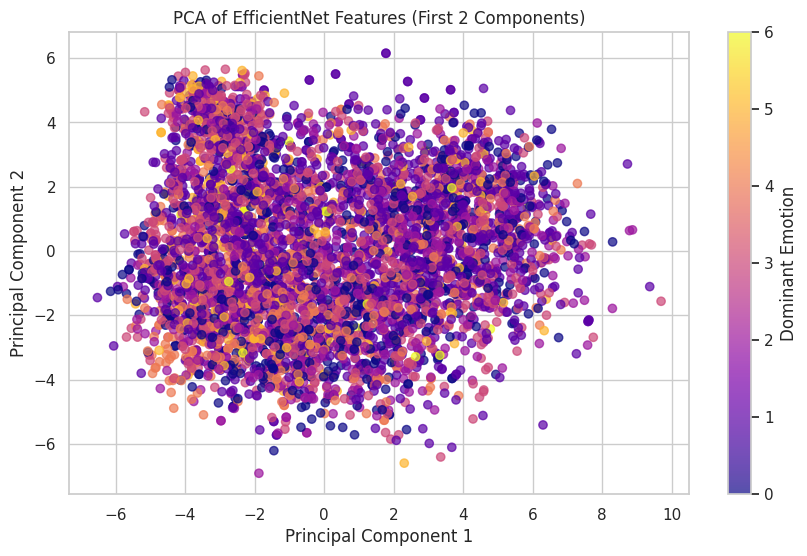

In [ ]:
plt.figure(figsize=(10, 6))
plt.scatter(pca_results[:, 0], pca_results[:, 1], c=pd.factorize(df['dominant_emotion'])[0], cmap='plasma', alpha=0.7)
plt.colorbar(label="Dominant Emotion")
plt.title("PCA of EfficientNet Features (First 2 Components)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.show()

###  Emotion Score Density by Brightness and Color Descriptor

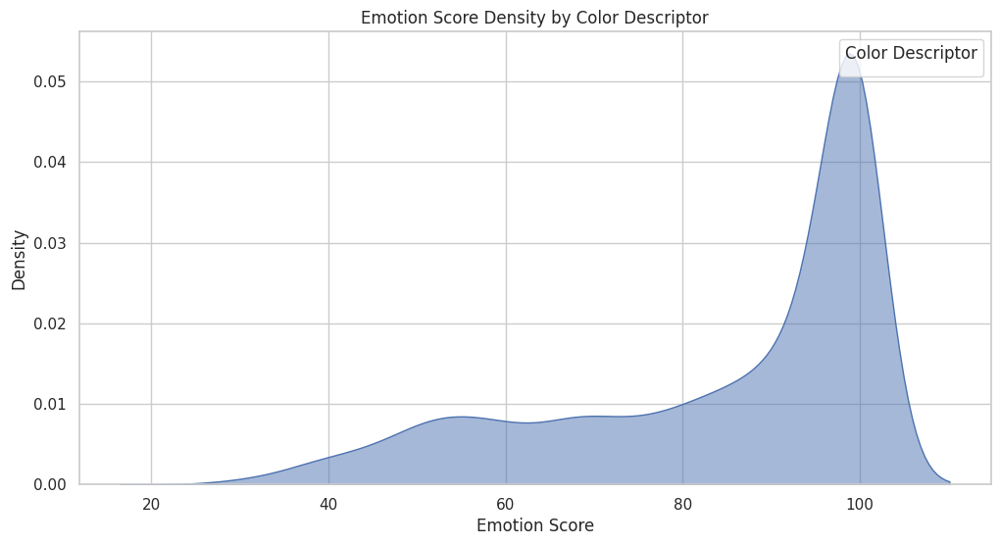

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x='emotion_score', hue='color_descriptor', fill=True, alpha=0.5)
plt.title("Emotion Score Density by Color Descriptor")
plt.xlabel("Emotion Score")
plt.ylabel("Density")
plt.legend(title="Color Descriptor")
plt.show()

# ---------------------------------------- Data Merging Phase ----------------------------------------

## Import libraries for data merging

In [ ]:
import pandas as pd

## Load the extracted features and labels CSVs

In [ ]:
features_df = pd.read_csv(features_csv_path)
labels_df = pd.read_csv(csv_file_path)

## Merge features with labels

In [ ]:
merged_df = features_df.merge(labels_df, on='image_name')

## Save merged data to a new CSV

In [ ]:
merged_csv_path = "/content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/merged_data.csv"
merged_df.to_csv(merged_csv_path, index=False)
print(f"Merged DataFrame saved to: {merged_csv_path}")

## ---------------------- Exploratory Data Analysis Phase ----------------------

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
sns.set(style="whitegrid")

In [ ]:
df = pd.read_csv('/content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/merged_data.csv')

## Data Analysis using head(), describe(), info()

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5019 entries, 0 to 5018
Columns: 1287 entries, image_name to social_demeanor
dtypes: float64(1282), object(5)
memory usage: 49.3+ MB


In [ ]:
df.describe()

,emotion_score,avg_brightness,effnet_feature_0,effnet_feature_1,effnet_feature_2,effnet_feature_3,effnet_feature_4,effnet_feature_5,effnet_feature_6,effnet_feature_7,...,effnet_feature_1270,effnet_feature_1271,effnet_feature_1272,effnet_feature_1273,effnet_feature_1274,effnet_feature_1275,effnet_feature_1276,effnet_feature_1277,effnet_feature_1278,effnet_feature_1279
count,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,...,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000,5019.000000
mean,84.284243,0.121742,-0.015570,0.029694,-0.007897,-0.032325,-0.011063,0.181564,0.102477,-0.020604,...,0.071549,-0.009199,-0.006720,0.064307,0.253690,0.108995,0.365561,0.091575,-0.036407,0.069453
std,18.554291,0.065007,0.223709,0.256939,0.216275,0.164498,0.214336,0.309966,0.291414,0.198913,...,0.287679,0.197789,0.208420,0.287453,0.369771,0.291097,0.410599,0.253817,0.177662,0.315029
min,26.633677,-0.058799,-0.226691,-0.242138,-0.247445,-0.221174,-0.233284,-0.226532,-0.228706,-0.246437,...,-0.223774,-0.235580,-0.224121,-0.249756,-0.237117,-0.247452,-0.195260,-0.242490,-0.225138,-0.244976
25%,71.576607,0.070937,-0.136067,-0.138140,-0.127150,-0.121092,-0.130316,-0.053138,-0.106279,-0.130828,...,-0.111317,-0.123843,-0.105496,-0.128076,-0.023266,-0.092346,0.038744,-0.082737,-0.125196,-0.150304
50%,93.297452,0.123333,-0.097388,-0.062209,-0.085569,-0.086500,-0.092593,0.102845,-0.000671,-0.095990,...,-0.043243,-0.079833,-0.073442,-0.045848,0.160073,0.017108,0.278564,0.009662,-0.094004,-0.048466
75%,99.584150,0.169085,0.012685,0.115067,0.023856,-0.011448,0.018682,0.329305,0.219293,0.007379,...,0.155673,0.036370,-0.001029,0.164381,0.426775,0.216812,0.599517,0.179991,-0.037378,0.185717
max,100.000000,0.343003,2.251738,2.344940,2.115978,1.820003,2.089447,2.269296,2.169681,1.558144,...,2.221228,1.647381,2.316033,2.400591,2.855211,2.636419,2.438466,2.109029,1.539168,2.458257


In [ ]:
df.head()

,image_name,dominant_emotion,emotion_score,color_descriptor,avg_brightness,effnet_feature_0,effnet_feature_1,effnet_feature_2,effnet_feature_3,effnet_feature_4,...,effnet_feature_1272,effnet_feature_1273,effnet_feature_1274,effnet_feature_1275,effnet_feature_1276,effnet_feature_1277,effnet_feature_1278,effnet_feature_1279,sentiment,social_demeanor
0,respectful-1.jpg,fear,42.944017,Dark,0.141921,0.231030,0.480867,-0.128490,0.178739,-0.149956,...,0.029058,-0.101270,0.525305,0.031480,-0.041296,-0.066651,-0.144403,0.075048,Positive,Respectful
1,respectful-2.jpg,happy,99.987644,Dark,0.166585,-0.060424,0.485108,0.173747,-0.098214,-0.097689,...,0.016607,0.352066,0.065295,0.172940,1.688780,0.238711,-0.108865,0.102636,Positive,Respectful
2,respectful-3.jpg,sad,97.665340,Dark,0.184303,0.445622,0.067298,-0.167476,0.009685,-0.047029,...,-0.042100,-0.085292,0.100180,-0.119115,0.178599,0.514279,-0.047832,0.666020,Positive,Respectful
3,respectful-4.jpg,neutral,80.693007,Dark,0.111270,-0.120287,-0.113242,-0.117253,-0.022577,0.029116,...,-0.059604,0.861931,0.020029,-0.053157,-0.150684,-0.134392,0.230609,0.426133,Positive,Respectful
4,respectful-5.jpg,angry,80.698566,Dark,0.146219,-0.081535,-0.094180,-0.101420,-0.128241,-0.123496,...,0.123625,-0.057946,-0.111634,0.516890,0.550758,0.138921,-0.125240,-0.148273,Positive,Respectful


###  Emotion Score vs. Brightness with Sentiment and Social Demeanor Overlay

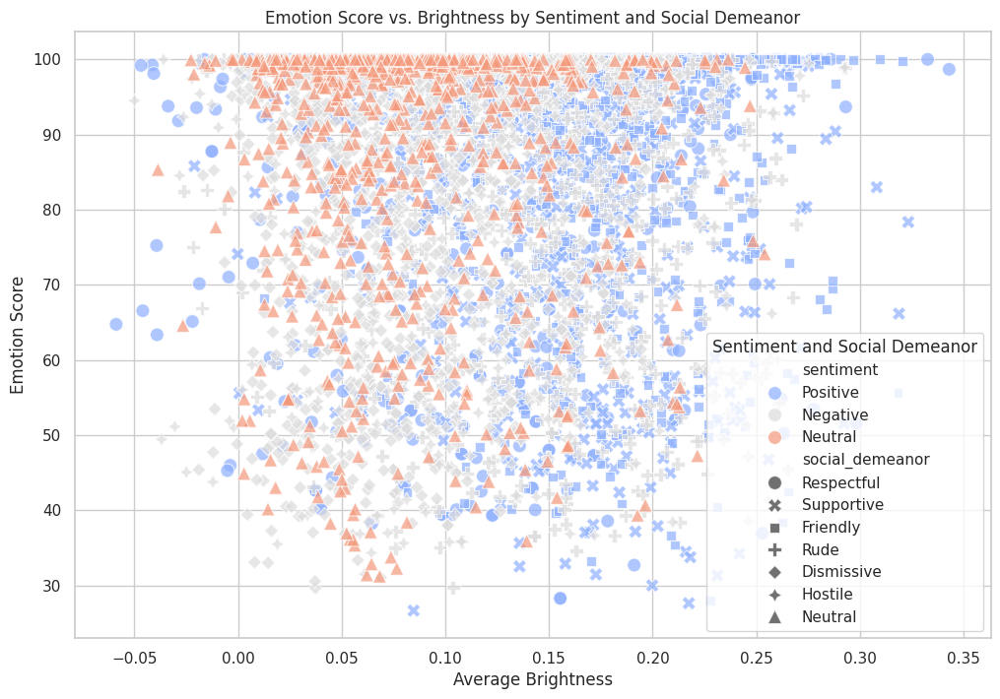

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df,
    x='avg_brightness',
    y='emotion_score',
    hue='sentiment',
    style='social_demeanor',
    palette='coolwarm',
    s=100,
    alpha=0.7
)

plt.title("Emotion Score vs. Brightness by Sentiment and Social Demeanor")
plt.xlabel("Average Brightness")
plt.ylabel("Emotion Score")
plt.legend(title="Sentiment and Social Demeanor")
plt.show()

### Dominant Emotion and Color Descriptor by Sentiment

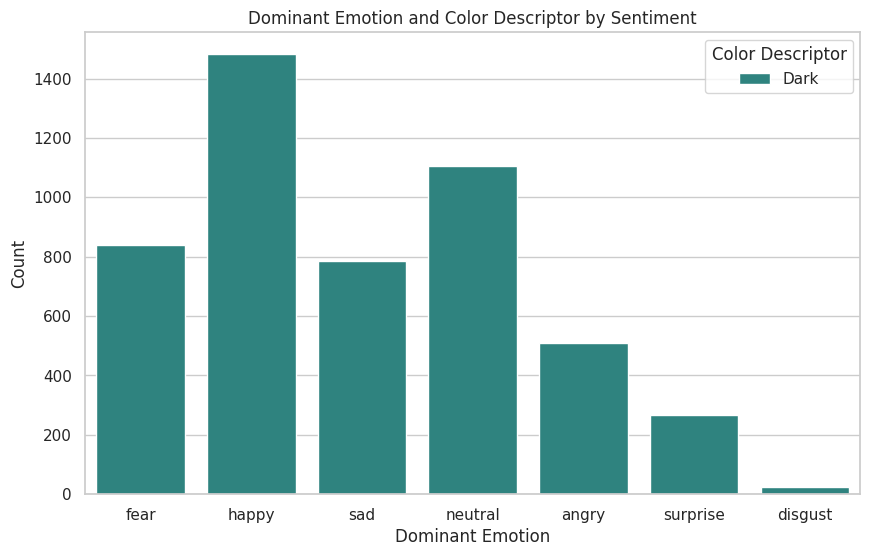

In [ ]:
plt.figure(figsize=(10, 6))
sns.countplot(data=df, x='dominant_emotion', hue='color_descriptor', palette='viridis')
plt.title("Dominant Emotion and Color Descriptor by Sentiment")
plt.xlabel("Dominant Emotion")
plt.ylabel("Count")
plt.legend(title="Color Descriptor")
plt.show()

### Average Brightness by Dominant Emotion and Sentiment

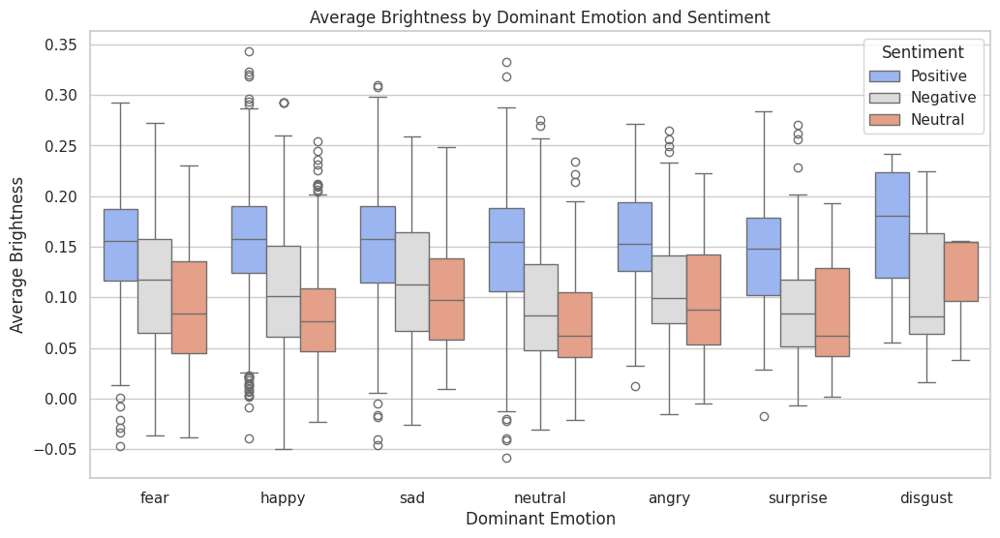

In [ ]:
plt.figure(figsize=(12, 6))
sns.boxplot(data=df, x='dominant_emotion', y='avg_brightness', hue='sentiment', palette='coolwarm')
plt.title("Average Brightness by Dominant Emotion and Sentiment")
plt.xlabel("Dominant Emotion")
plt.ylabel("Average Brightness")
plt.legend(title="Sentiment")
plt.show()

### Emotion Score Distribution by Color Descriptor and Sentiment

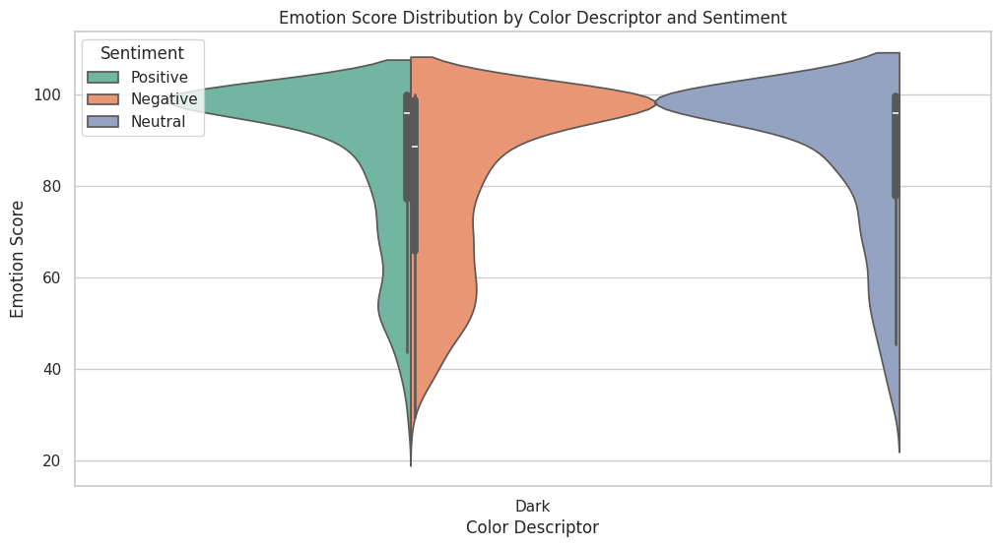

In [ ]:
plt.figure(figsize=(12, 6))
sns.violinplot(data=df, x='color_descriptor', y='emotion_score', hue='sentiment', split=True, palette='Set2')
plt.title("Emotion Score Distribution by Color Descriptor and Sentiment")
plt.xlabel("Color Descriptor")
plt.ylabel("Emotion Score")
plt.legend(title="Sentiment")
plt.show()

### EfficientNet Feature Relationship with Emotion Score and Sentiment

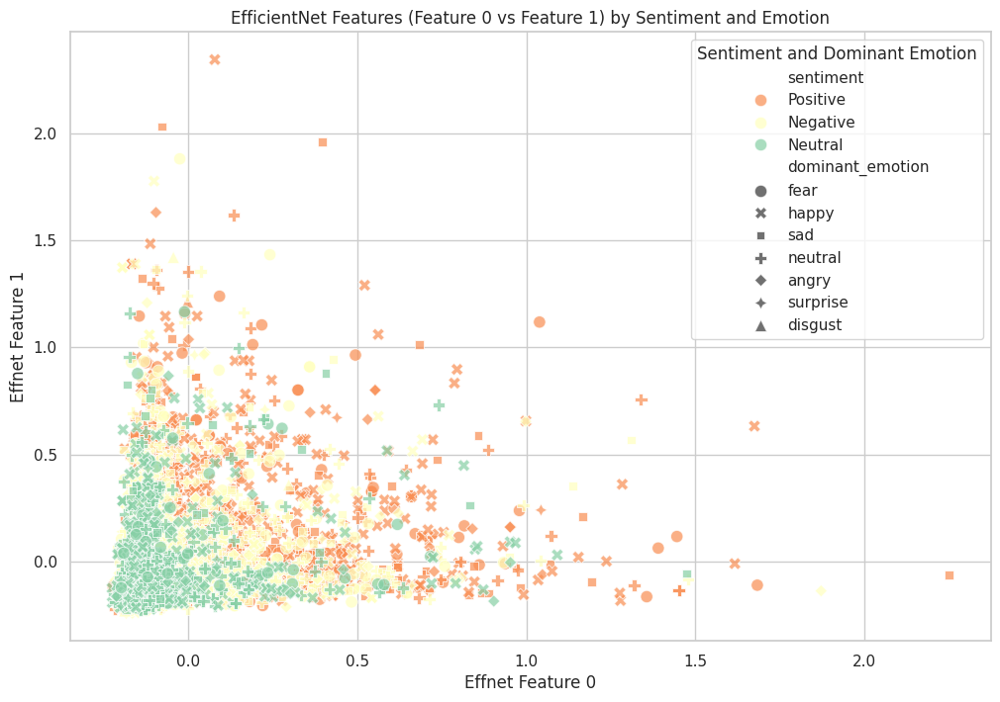

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df,
    x='effnet_feature_0',
    y='effnet_feature_1',
    hue='sentiment',
    style='dominant_emotion',
    palette='Spectral',
    s=80,
    alpha=0.7
)
plt.title("EfficientNet Features (Feature 0 vs Feature 1) by Sentiment and Emotion")
plt.xlabel("Effnet Feature 0")
plt.ylabel("Effnet Feature 1")
plt.legend(title="Sentiment and Dominant Emotion")
plt.show()

### Heatmap of Emotion Co-occurrences with Social Demeanor

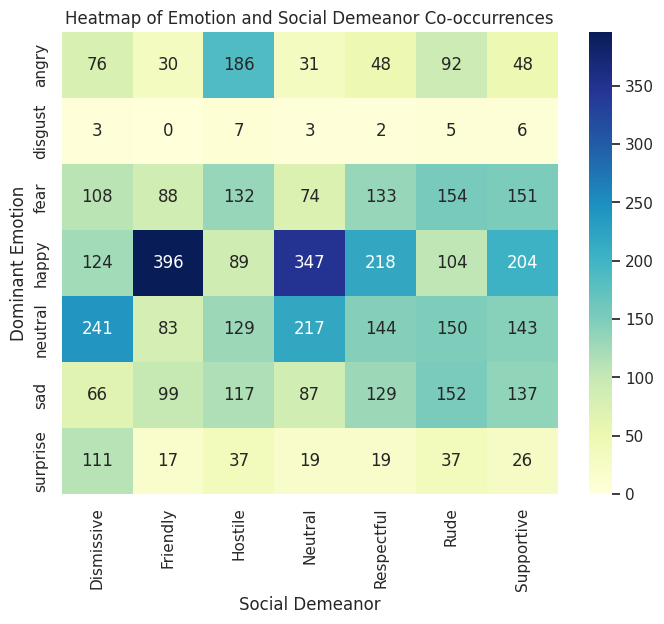

In [ ]:
co_occurrence_matrix = pd.crosstab(df['dominant_emotion'], df['social_demeanor'])
plt.figure(figsize=(8, 6))
sns.heatmap(co_occurrence_matrix, annot=True, cmap="YlGnBu", fmt="d")
plt.title("Heatmap of Emotion and Social Demeanor Co-occurrences")
plt.xlabel("Social Demeanor")
plt.ylabel("Dominant Emotion")
plt.show()

###  Average Feature Embeddings by Sentiment (Effnet Feature 0 and Feature 1)

<ipython-input-254-ba167eb18242>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='sentiment', y='effnet_feature_0', palette='coolwarm')


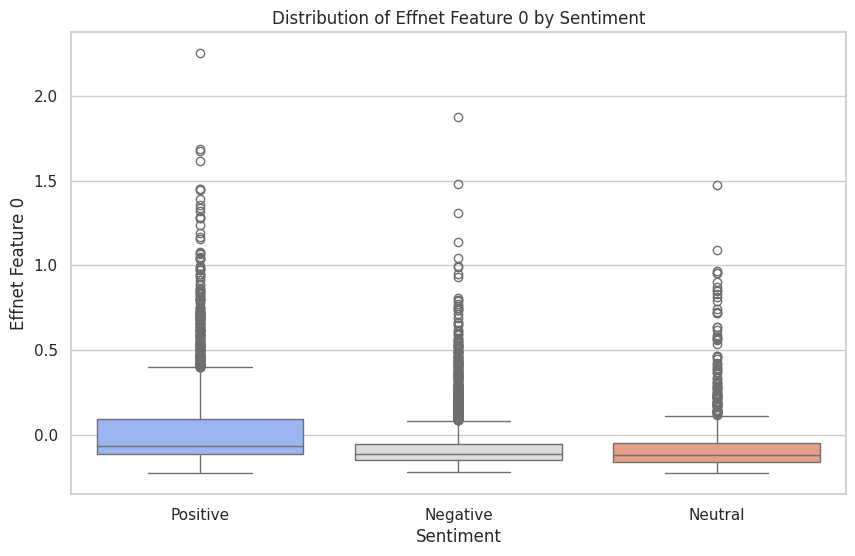

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='sentiment', y='effnet_feature_0', palette='coolwarm')
plt.title("Distribution of Effnet Feature 0 by Sentiment")
plt.xlabel("Sentiment")
plt.ylabel("Effnet Feature 0")
plt.show()

<ipython-input-255-63dafcf7a491>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='sentiment', y='effnet_feature_1', palette='coolwarm')


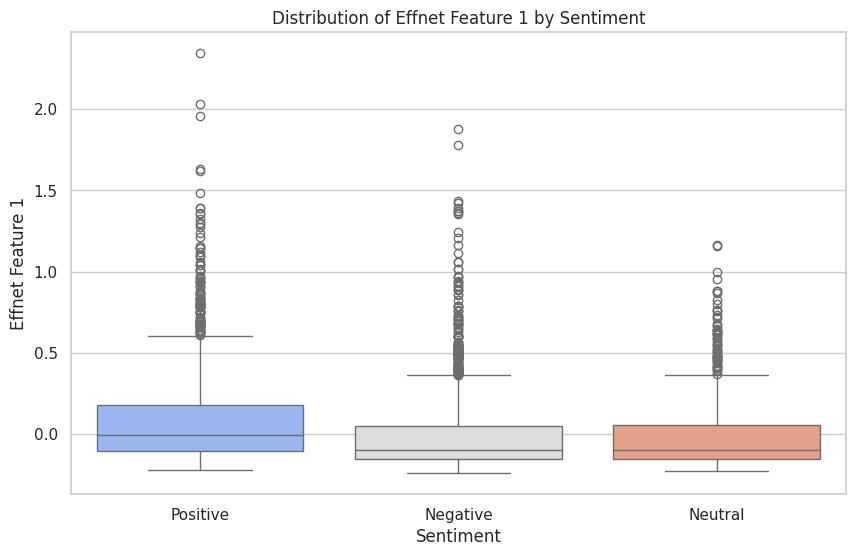

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='sentiment', y='effnet_feature_1', palette='coolwarm')
plt.title("Distribution of Effnet Feature 1 by Sentiment")
plt.xlabel("Sentiment")
plt.ylabel("Effnet Feature 1")
plt.show()

### Brightness and Emotion Score Distribution by Social Demeanor

<ipython-input-256-e13393055b1c>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='social_demeanor', y='avg_brightness', palette='Set1')


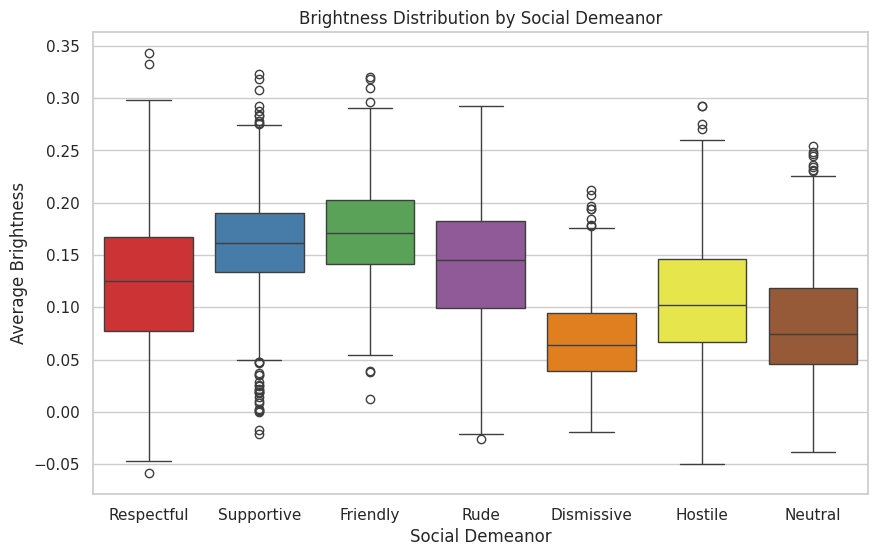

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='social_demeanor', y='avg_brightness', palette='Set1')
plt.title("Brightness Distribution by Social Demeanor")
plt.xlabel("Social Demeanor")
plt.ylabel("Average Brightness")
plt.show()

<ipython-input-257-384982641b2d>:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(data=df, x='social_demeanor', y='emotion_score', palette='Set2')


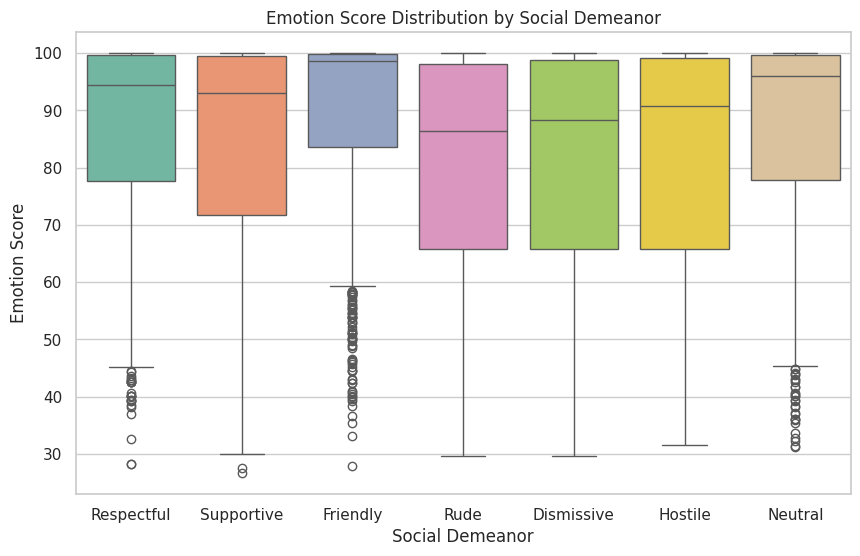

In [ ]:
plt.figure(figsize=(10, 6))
sns.boxplot(data=df, x='social_demeanor', y='emotion_score', palette='Set2')
plt.title("Emotion Score Distribution by Social Demeanor")
plt.xlabel("Social Demeanor")
plt.ylabel("Emotion Score")
plt.show()

### Dominant Emotion and Color Descriptor Relationship with EfficientNet Features

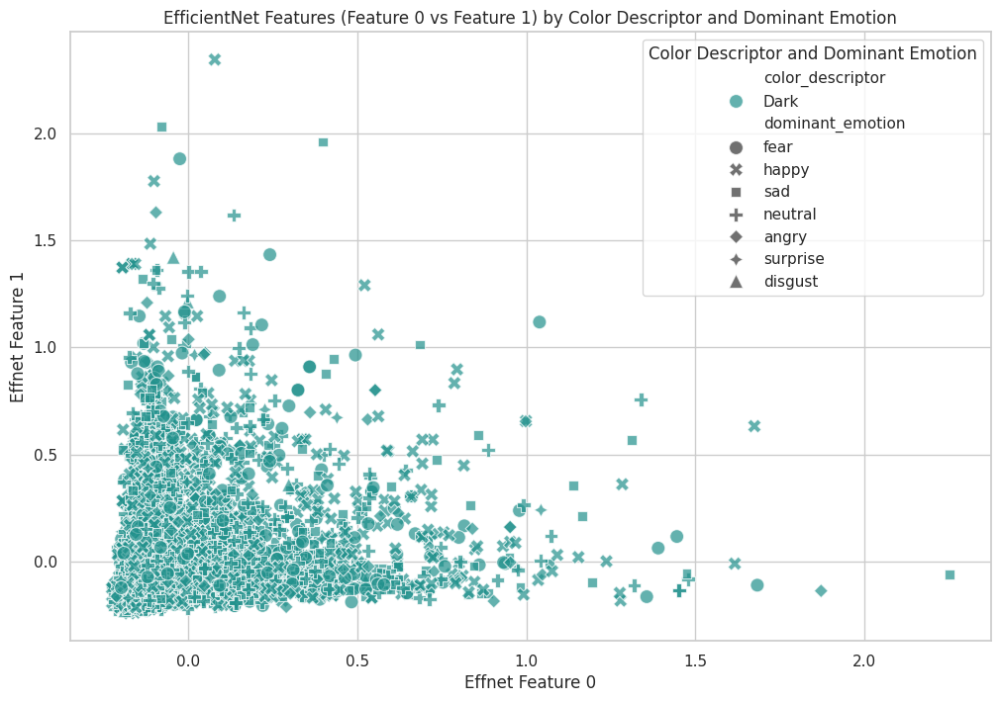

In [ ]:
plt.figure(figsize=(12, 8))
sns.scatterplot(
    data=df,
    x='effnet_feature_0',
    y='effnet_feature_1',
    hue='color_descriptor',
    style='dominant_emotion',
    palette='viridis',
    s=100,
    alpha=0.7
)
plt.title("EfficientNet Features (Feature 0 vs Feature 1) by Color Descriptor and Dominant Emotion")
plt.xlabel("Effnet Feature 0")
plt.ylabel("Effnet Feature 1")
plt.legend(title="Color Descriptor and Dominant Emotion")
plt.show()

### Emotion Score Density by Sentiment and Social Demeanor

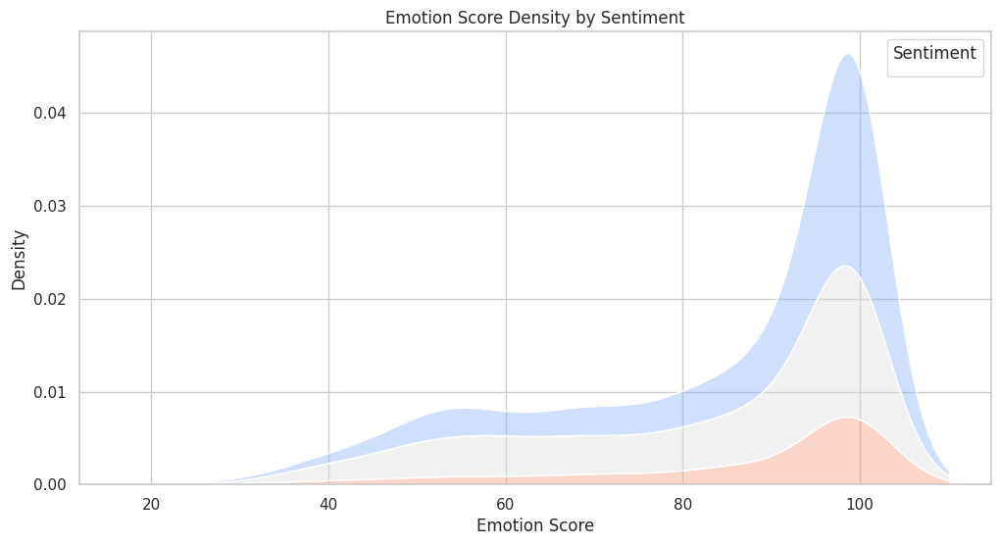

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x='emotion_score', hue='sentiment', multiple="stack", palette='coolwarm', fill=True, alpha=0.4)
plt.title("Emotion Score Density by Sentiment")
plt.xlabel("Emotion Score")
plt.ylabel("Density")
plt.legend(title="Sentiment")
plt.show()

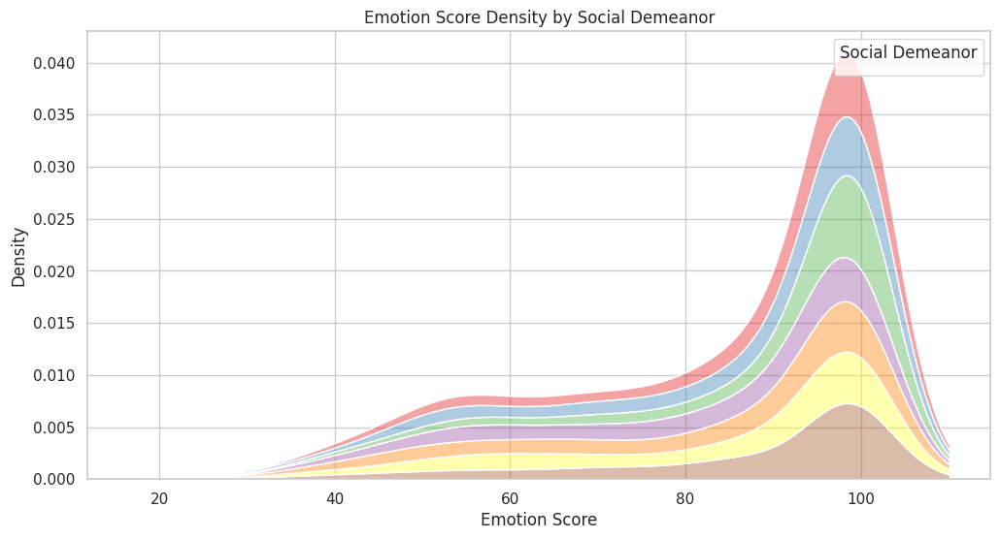

In [ ]:
plt.figure(figsize=(12, 6))
sns.kdeplot(data=df, x='emotion_score', hue='social_demeanor', multiple="stack", palette='Set1', fill=True, alpha=0.4)
plt.title("Emotion Score Density by Social Demeanor")
plt.xlabel("Emotion Score")
plt.ylabel("Density")
plt.legend(title="Social Demeanor")
plt.show()

# ---------------------------------------- Model Training Phase ----------------------------------------

In [ ]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.utils.class_weight import compute_class_weight
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense, BatchNormalization, Dropout, LeakyReLU
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import ReduceLROnPlateau, EarlyStopping
import matplotlib.pyplot as plt

In [ ]:
file_path = '/content/drive/MyDrive/Images-Social-Demeanor/CSV-Files/merged_data.csv'

In [ ]:
data = pd.read_csv(file_path)

In [ ]:
print(data.columns)

Index(['image_name', 'dominant_emotion', 'emotion_score', 'color_descriptor',
       'avg_brightness', 'effnet_feature_0', 'effnet_feature_1',
       'effnet_feature_2', 'effnet_feature_3', 'effnet_feature_4',
       ...
       'effnet_feature_1272', 'effnet_feature_1273', 'effnet_feature_1274',
       'effnet_feature_1275', 'effnet_feature_1276', 'effnet_feature_1277',
       'effnet_feature_1278', 'effnet_feature_1279', 'sentiment',
       'social_demeanor'],
      dtype='object', length=1287)


In [ ]:
unique_demeanors = data['social_demeanor'].unique()
print("Unique values in 'demeanor' column:")
print(unique_demeanors)

Unique values in 'demeanor' column:
['Respectful' 'Supportive' 'Friendly' 'Rude' 'Dismissive' 'Hostile'
 'Neutral']


In [ ]:
unique_sentiments = data['sentiment'].unique()
print("\nUnique values in 'sentiment' column:")
print(unique_sentiments)


Unique values in 'sentiment' column:
['Positive' 'Negative' 'Neutral']


In [ ]:
demeanor_counts = data['social_demeanor'].value_counts()
print("\nFrequency of each demeanor:")
print(demeanor_counts)


Frequency of each demeanor:
social_demeanor
Neutral       778
Dismissive    729
Supportive    715
Friendly      713
Hostile       697
Rude          694
Respectful    693
Name: count, dtype: int64


In [ ]:
sentiment_counts = data['sentiment'].value_counts()
print("\nFrequency of each sentiment:")
sentiment_counts


Frequency of each sentiment:


,count
sentiment,
Positive,2121
Negative,2120
Neutral,778


In [ ]:
features = data.filter(like="effnet_feature").values
sentiment_labels = data['sentiment'].values
demeanor_labels = data['social_demeanor'].values

In [ ]:
sentiment_encoder = LabelEncoder()
demeanor_encoder = LabelEncoder()
sentiment_labels_encoded = sentiment_encoder.fit_transform(sentiment_labels)
demeanor_labels_encoded = demeanor_encoder.fit_transform(demeanor_labels)

In [ ]:
print("Sentiment Labels Encoded:", np.unique(sentiment_labels_encoded))
print("Demeanor Labels Encoded:", np.unique(demeanor_labels_encoded))

Sentiment Labels Encoded: [0 1 2]
Demeanor Labels Encoded: [0 1 2 3 4 5 6]


In [ ]:
x_train, x_temp, y_train_sentiment, y_temp_sentiment, y_train_demeanor, y_temp_demeanor = train_test_split(
    features, sentiment_labels_encoded, demeanor_labels_encoded, test_size=0.3, random_state=42)

In [ ]:
x_val, x_test, y_val_sentiment, y_test_sentiment, y_val_demeanor, y_test_demeanor = train_test_split(
    x_temp, y_temp_sentiment, y_temp_demeanor, test_size=0.5, random_state=42)

In [ ]:
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_val = scaler.transform(x_val)
x_test = scaler.transform(x_test)

In [ ]:
sentiment_class_weights = compute_class_weight('balanced', classes=np.unique(y_train_sentiment), y=y_train_sentiment)
demeanor_class_weights = compute_class_weight('balanced', classes=np.unique(y_train_demeanor), y=y_train_demeanor)

In [ ]:
sentiment_class_weights = dict(enumerate(sentiment_class_weights))
demeanor_class_weights = dict(enumerate(demeanor_class_weights))

In [ ]:
input_layer = Input(shape=(x_train.shape[1],))
x = Dense(512)(input_layer)
x = LeakyReLU()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)
x = Dense(256)(x)
x = LeakyReLU()(x)
x = BatchNormalization()(x)
x = Dropout(0.5)(x)

In [ ]:
sentiment_output = Dense(3, activation='softmax', name='sentiment')(x)
demeanor_output = Dense(7, activation='softmax', name='demeanor')(x)

In [ ]:
model = Model(inputs=input_layer, outputs=[sentiment_output, demeanor_output])

In [ ]:
loss_weights = {'sentiment': 1.0, 'demeanor': 1.5}

In [ ]:
model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss={
        'sentiment': 'sparse_categorical_crossentropy',
        'social_demeanor': 'sparse_categorical_crossentropy'
    },
    loss_weights=loss_weights,
    metrics={'sentiment': 'accuracy', 'social_demeanor': 'accuracy'}
)

In [ ]:
callbacks = [
    ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=5, verbose=1, min_lr=1e-6),
    EarlyStopping(monitor='val_loss', patience=10, verbose=1, restore_best_weights=True)
]

In [ ]:
sentiment_model = Model(inputs=input_layer, outputs=sentiment_output)

In [ ]:
sentiment_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
sentiment_model.fit(x_train, y_train_sentiment, epochs=20, batch_size=32)

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 7s 22ms/step - accuracy: 0.6120 - loss: 1.2541
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 16ms/step - accuracy: 0.7430 - loss: 0.6856
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.8088 - loss: 0.5219
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.8319 - loss: 0.4668
Epoch 5/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.8490 - loss: 0.4147
Epoch 6/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 20ms/step - accuracy: 0.8712 - loss: 0.3348
Epoch 7/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 18ms/step - accuracy: 0.8816 - loss: 0.3195
Epoch 8/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.8853 - loss: 0.2876
Epoch 9/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.8994 - loss: 0.2532
Epoch 10/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.9133 - loss: 0.2443
Epoch 11/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 11ms/step - accuracy: 0.9091 - loss: 0.2212
Epoch 12/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
demeanor_model = Model(inputs=input_layer, outputs=demeanor_output)

In [ ]:
demeanor_model.compile(
    optimizer=Adam(learning_rate=0.001),
    loss='sparse_categorical_crossentropy',
    metrics=['accuracy']
)

In [ ]:
demeanor_model.fit(x_train, y_train_demeanor, epochs=20, batch_size=32)

Epoch 1/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 4s 14ms/step - accuracy: 0.4856 - loss: 1.6069
Epoch 2/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 13ms/step - accuracy: 0.6872 - loss: 0.8536
Epoch 3/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 1s 13ms/step - accuracy: 0.7454 - loss: 0.6849
Epoch 4/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 14ms/step - accuracy: 0.7639 - loss: 0.6262
Epoch 5/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 20ms/step - accuracy: 0.8093 - loss: 0.5227
Epoch 6/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 26ms/step - accuracy: 0.8256 - loss: 0.4684
Epoch 7/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 15ms/step - accuracy: 0.8401 - loss: 0.4431
Epoch 8/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.8742 - loss: 0.3924
Epoch 9/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 15ms/step - accuracy: 0.8666 - loss: 0.3755
Epoch 10/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 2s 14ms/step - accuracy: 0.8643 - loss: 0.3581
Epoch 11/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 3s 17ms/step - accuracy: 0.8824 - loss: 0.3161
Epoch 12/20
110/110 ━━━━━━━━━━━━━━━━━━━━ 

In [ ]:
sentiment_model.save('/content/drive/MyDrive/Images-Social-Demeanor/model-2/sentiment_model.h5')
demeanor_model.save('/content/drive/MyDrive/Images-Social-Demeanor/model-2/demeanor_model.h5')

# ---------------------------------------- Model Evolution Phase ----------------------------------------

In [ ]:
from tensorflow.keras.models import load_model
import numpy as np
import pandas as pd
from sklearn.metrics import (
    precision_recall_fscore_support, classification_report,
    confusion_matrix, roc_auc_score, log_loss
)
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import LabelEncoder
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.metrics import roc_curve
from sklearn.metrics import precision_recall_curve

In [ ]:
sentiment_model = load_model('/content/drive/MyDrive/Images-Social-Demeanor/model-2/sentiment_model.h5')
demeanor_model = load_model('/content/drive/MyDrive/Images-Social-Demeanor/model-2/demeanor_model.h5')

In [ ]:
sentiment_predictions = np.argmax(sentiment_model.predict(x_test), axis=1)
demeanor_predictions = np.argmax(demeanor_model.predict(x_test), axis=1)

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 13ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


## ------------------------- Sentiment Model Evaluation --------------------------

In [ ]:
sentiment_accuracy = np.mean(sentiment_predictions == y_test_sentiment)
print(f"Sentiment Model Accuracy: {sentiment_accuracy * 100:.2f}%")

Sentiment Model Accuracy: 79.81%


In [ ]:
sentiment_precision, sentiment_recall, sentiment_f1, _ = precision_recall_fscore_support(
    y_test_sentiment, sentiment_predictions, average='weighted'
)
print(f"Sentiment Model Precision: {sentiment_precision:.2f}")
print(f"Sentiment Model Recall: {sentiment_recall:.2f}")
print(f"Sentiment Model F1 Score: {sentiment_f1:.2f}")

Sentiment Model Precision: 0.80
Sentiment Model Recall: 0.80
Sentiment Model F1 Score: 0.80


In [ ]:
sentiment_log_loss = log_loss(y_test_sentiment, sentiment_model.predict(x_test))
print(f"Sentiment Model Log Loss: {sentiment_log_loss:.2f}")

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 4ms/step
Sentiment Model Log Loss: 0.67


In [ ]:
sentiment_auc = roc_auc_score(
    pd.get_dummies(y_test_sentiment),
    sentiment_model.predict(x_test),
    multi_class='ovr'
)
print(f"Sentiment Model AUC-ROC: {sentiment_auc:.2f}")

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
Sentiment Model AUC-ROC: 0.91


In [ ]:
print("\nSentiment Model Classification Report:")
print(classification_report(y_test_sentiment, sentiment_predictions))


Sentiment Model Classification Report:
              precision    recall  f1-score   support

           0       0.77      0.87      0.82       303
           1       0.74      0.67      0.70       126
           2       0.85      0.78      0.82       324

    accuracy                           0.80       753
   macro avg       0.79      0.77      0.78       753
weighted avg       0.80      0.80      0.80       753



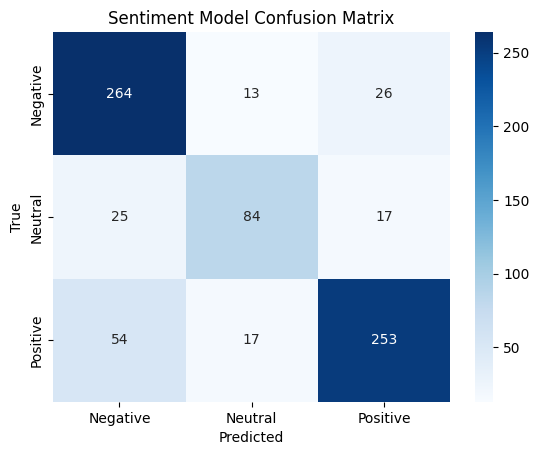

In [ ]:
sentiment_cm = confusion_matrix(y_test_sentiment, sentiment_predictions)
sns.heatmap(sentiment_cm, annot=True, fmt='d', cmap='Blues', xticklabels=sentiment_encoder.classes_, yticklabels=sentiment_encoder.classes_)
plt.title("Sentiment Model Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

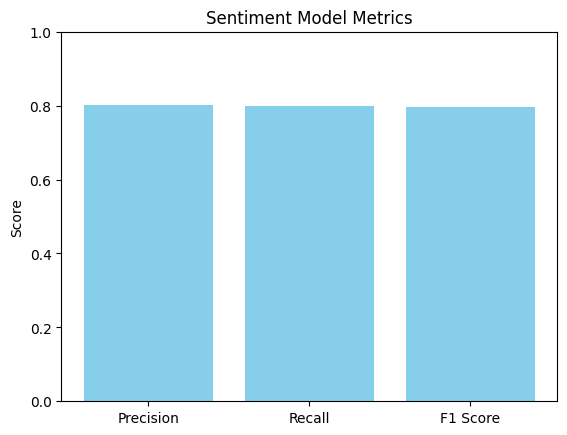

In [ ]:
metrics = ['Precision', 'Recall', 'F1 Score']
values = [sentiment_precision, sentiment_recall, sentiment_f1]
plt.bar(metrics, values, color='skyblue')
plt.title('Sentiment Model Metrics')
plt.ylabel('Score')
plt.ylim(0, 1)
plt.show()

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step


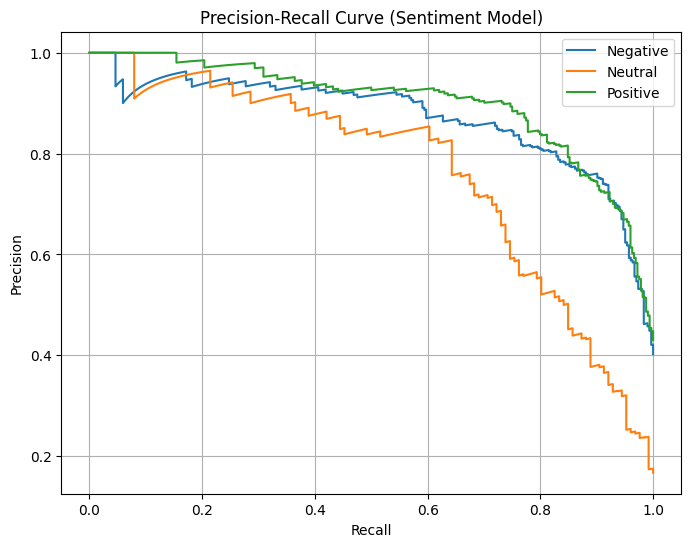

In [ ]:
plt.figure(figsize=(8, 6))
for i, class_name in enumerate(sentiment_encoder.classes_):
    # Extract true binary labels and predicted probabilities for the current class
    true_binary = pd.get_dummies(y_test_sentiment).iloc[:, i].values
    predicted_probs = sentiment_model.predict(x_test)[:, i]

    # Compute precision and recall
    precision, recall, _ = precision_recall_curve(true_binary, predicted_probs)

    # Plot the Precision-Recall curve
    plt.plot(recall, precision, label=f"{class_name}")
plt.title("Precision-Recall Curve (Sentiment Model)")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid()
plt.show()

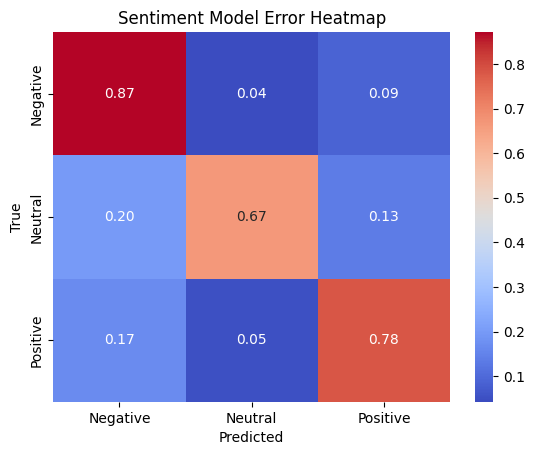

In [ ]:
sentiment_error_cm = confusion_matrix(y_test_sentiment, sentiment_predictions)
error_heatmap = sentiment_error_cm / sentiment_error_cm.sum(axis=1, keepdims=True)
sns.heatmap(error_heatmap, annot=True, fmt='.2f', cmap='coolwarm', xticklabels=sentiment_encoder.classes_, yticklabels=sentiment_encoder.classes_)
plt.title("Sentiment Model Error Heatmap")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step


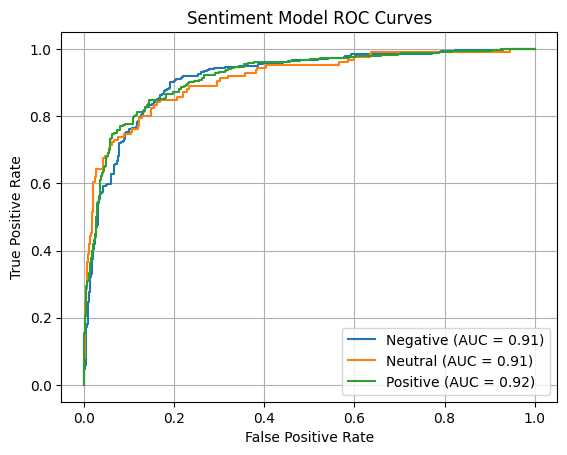

In [ ]:
for i, class_name in enumerate(sentiment_encoder.classes_):
    y_test_sentiment_dummies = pd.get_dummies(y_test_sentiment).to_numpy()
    fpr, tpr, _ = roc_curve(y_test_sentiment_dummies[:, i], sentiment_model.predict(x_test)[:, i])
    plt.plot(fpr, tpr, label=f"{class_name} (AUC = {roc_auc_score(y_test_sentiment_dummies[:, i], sentiment_model.predict(x_test)[:, i]):.2f})")
plt.title('Sentiment Model ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid()
plt.show()

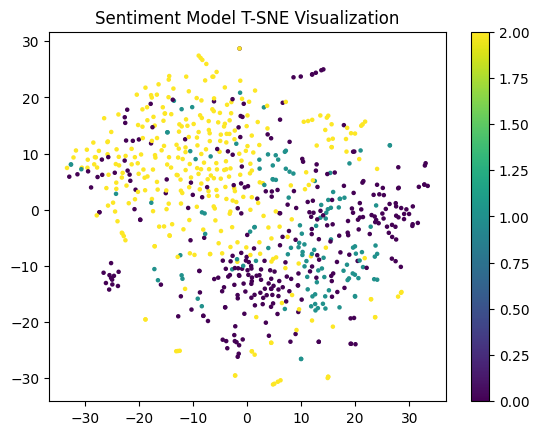

In [ ]:
tsne = TSNE(n_components=2, random_state=42)
sentiment_features_2d = tsne.fit_transform(x_test)
plt.scatter(sentiment_features_2d[:, 0], sentiment_features_2d[:, 1], c=y_test_sentiment, cmap='viridis', s=5)
plt.colorbar()
plt.title('Sentiment Model T-SNE Visualization')
plt.show()

## ------------------------- Demeanor Model Evaluation --------------------------

In [ ]:
demeanor_accuracy = np.mean(demeanor_predictions == y_test_demeanor)
print(f"Demeanor Model Accuracy: {demeanor_accuracy * 100:.2f}%")

Demeanor Model Accuracy: 71.85%


In [ ]:
demeanor_precision, demeanor_recall, demeanor_f1, _ = precision_recall_fscore_support(
    y_test_demeanor, demeanor_predictions, average='weighted'
)
print(f"Demeanor Model Precision: {demeanor_precision:.2f}")
print(f"Demeanor Model Recall: {demeanor_recall:.2f}")
print(f"Demeanor Model F1 Score: {demeanor_f1:.2f}")

Demeanor Model Precision: 0.72
Demeanor Model Recall: 0.72
Demeanor Model F1 Score: 0.72


In [ ]:
demeanor_log_loss = log_loss(y_test_demeanor, demeanor_model.predict(x_test))
print(f"Demeanor Model Log Loss: {demeanor_log_loss:.2f}")

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Demeanor Model Log Loss: 1.45


In [ ]:
demeanor_auc = roc_auc_score(
    pd.get_dummies(y_test_demeanor),
    demeanor_model.predict(x_test),
    multi_class='ovr'
)
print(f"Demeanor Model AUC-ROC: {demeanor_auc:.2f}")

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
Demeanor Model AUC-ROC: 0.92


In [ ]:
print("\nDemeanor Model Classification Report:")
print(classification_report(y_test_demeanor, demeanor_predictions))


Demeanor Model Classification Report:
              precision    recall  f1-score   support

           0       0.84      0.95      0.89        95
           1       0.68      0.66      0.67       112
           2       0.71      0.73      0.72       102
           3       0.79      0.68      0.73       126
           4       0.82      0.76      0.79       117
           5       0.60      0.61      0.60       106
           6       0.59      0.66      0.62        95

    accuracy                           0.72       753
   macro avg       0.72      0.72      0.72       753
weighted avg       0.72      0.72      0.72       753



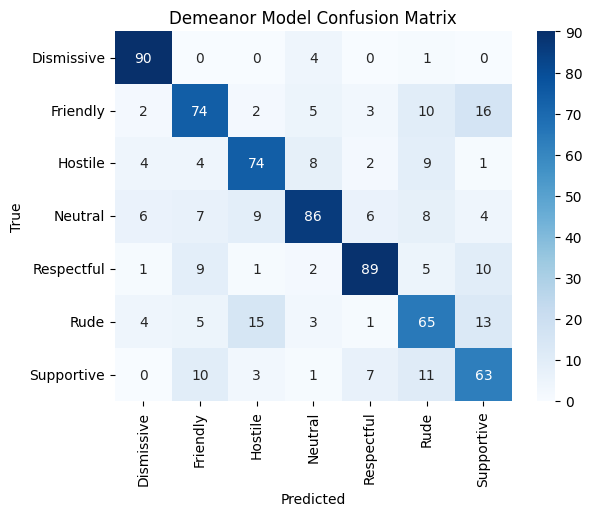

In [ ]:
demeanor_cm = confusion_matrix(y_test_demeanor, demeanor_predictions)
sns.heatmap(demeanor_cm, annot=True, fmt='d', cmap='Blues', xticklabels=demeanor_encoder.classes_, yticklabels=demeanor_encoder.classes_)
plt.title("Demeanor Model Confusion Matrix")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

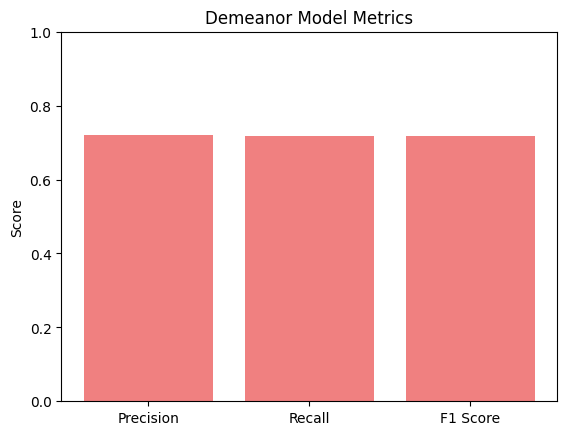

In [ ]:
metrics = ['Precision', 'Recall', 'F1 Score']
values = [demeanor_precision, demeanor_recall, demeanor_f1]
plt.bar(metrics, values, color='lightcoral')
plt.title('Demeanor Model Metrics')
plt.ylabel('Score')
plt.ylim(0, 1)
plt.show()

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 10ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 12ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 8ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step


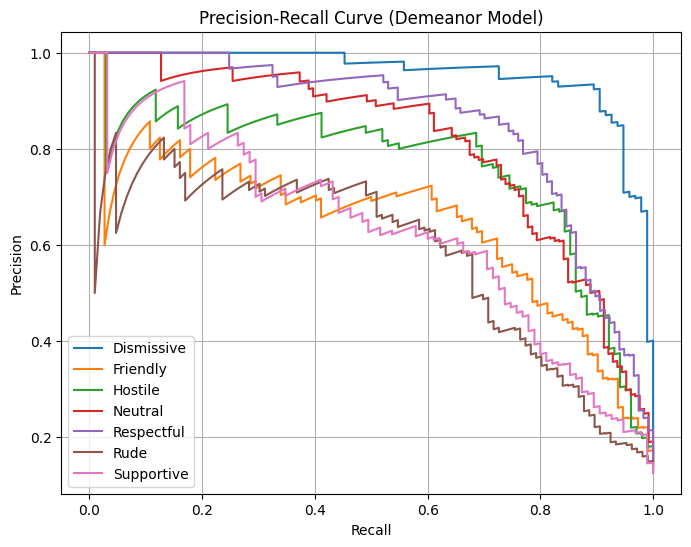

In [ ]:
plt.figure(figsize=(8, 6))
for i, class_name in enumerate(demeanor_encoder.classes_):
    # Extract true binary labels and predicted probabilities for the current class
    true_binary = pd.get_dummies(y_test_demeanor).iloc[:, i].values
    predicted_probs = demeanor_model.predict(x_test)[:, i]

    # Compute precision and recall
    precision, recall, _ = precision_recall_curve(true_binary, predicted_probs)

    # Plot the Precision-Recall curve
    plt.plot(recall, precision, label=f"{class_name}")
plt.title("Precision-Recall Curve (Demeanor Model)")
plt.xlabel("Recall")
plt.ylabel("Precision")
plt.legend()
plt.grid()
plt.show()

24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 11ms/step


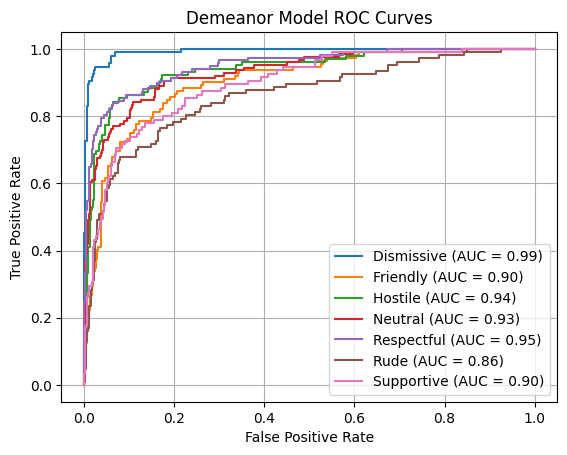

In [ ]:
for i, class_name in enumerate(demeanor_encoder.classes_):
    # Convert the one-hot encoded DataFrame to a NumPy array
    y_test_demeanor_dummies = pd.get_dummies(y_test_demeanor).to_numpy()
    fpr, tpr, _ = roc_curve(y_test_demeanor_dummies[:, i], demeanor_model.predict(x_test)[:, i])
    plt.plot(fpr, tpr, label=f"{class_name} (AUC = {roc_auc_score(y_test_demeanor_dummies[:, i],
     demeanor_model.predict(x_test)[:, i]):.2f})")
plt.title('Demeanor Model ROC Curves')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend()
plt.grid()
plt.show()

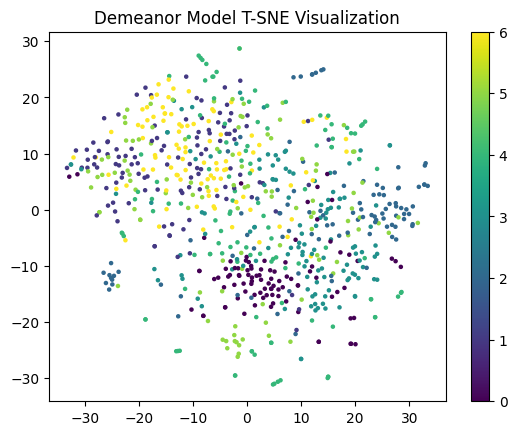

In [ ]:
demeanor_features_2d = tsne.fit_transform(x_test)
plt.scatter(demeanor_features_2d[:, 0], demeanor_features_2d[:, 1], c=y_test_demeanor, cmap='viridis', s=5)
plt.colorbar()
plt.title('Demeanor Model T-SNE Visualization')
plt.show()

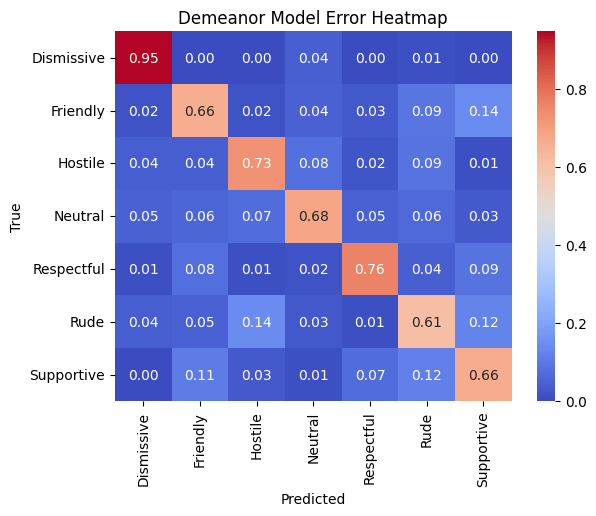

In [ ]:
demeanor_error_cm = confusion_matrix(y_test_demeanor, demeanor_predictions)
demeanor_error_heatmap = demeanor_error_cm / demeanor_error_cm.sum(axis=1, keepdims=True)
sns.heatmap(demeanor_error_heatmap, annot=True, fmt='.2f', cmap='coolwarm', 
xticklabels=demeanor_encoder.classes_, yticklabels=demeanor_encoder.classes_)
plt.title("Demeanor Model Error Heatmap")
plt.xlabel("Predicted")
plt.ylabel("True")
plt.show()

## ------------------------- Comparative Visualizations --------------------------

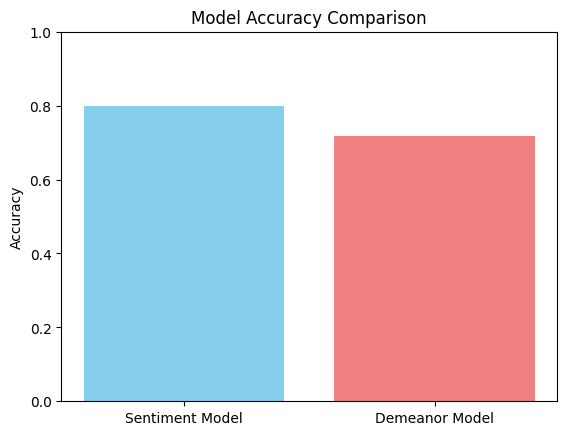

In [ ]:
models = ['Sentiment Model', 'Demeanor Model']
accuracies = [sentiment_accuracy, demeanor_accuracy]
plt.bar(models, accuracies, color=['skyblue', 'lightcoral'])
plt.title('Model Accuracy Comparison')
plt.ylabel('Accuracy')
plt.ylim(0, 1)
plt.show()

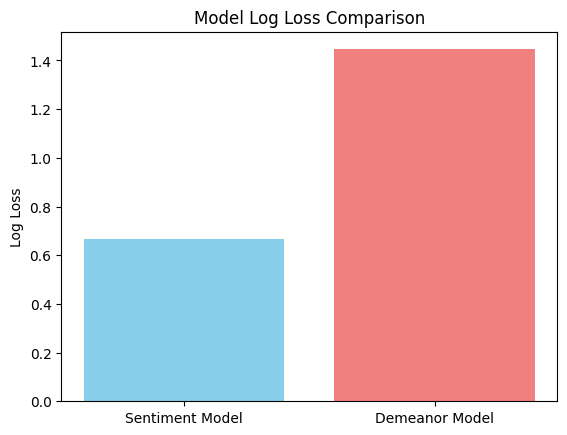

In [ ]:
log_losses = [sentiment_log_loss, demeanor_log_loss]
plt.bar(models, log_losses, color=['skyblue', 'lightcoral'])
plt.title('Model Log Loss Comparison')
plt.ylabel('Log Loss')
plt.show()

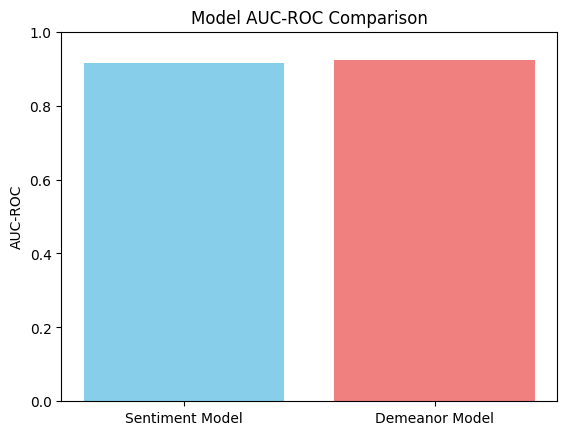

In [ ]:
auc_scores = [sentiment_auc, demeanor_auc]
plt.bar(models, auc_scores, color=['skyblue', 'lightcoral'])
plt.title('Model AUC-ROC Comparison')
plt.ylabel('AUC-ROC')
plt.ylim(0, 1)
plt.show()

In [ ]:
sentiment_distribution = pd.Series(y_test_sentiment).value_counts()
demeanor_distribution = pd.Series(y_test_demeanor).value_counts()

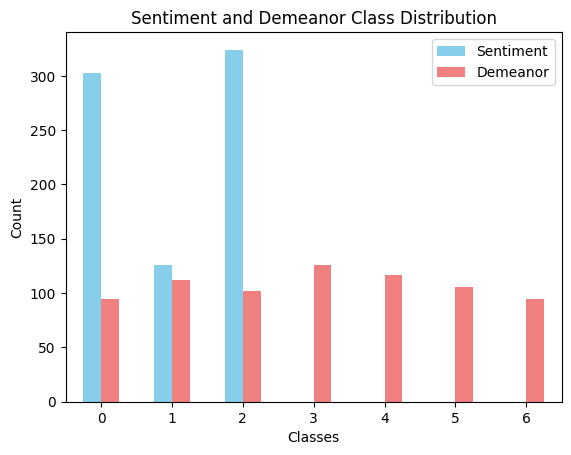

In [ ]:
combined_df = pd.DataFrame({
    'Sentiment': sentiment_distribution,
    'Demeanor': demeanor_distribution
})

combined_df.plot(kind='bar', color=['skyblue', 'lightcoral'])
plt.xlabel('Classes')
plt.ylabel('Count')
plt.title('Sentiment and Demeanor Class Distribution')
plt.xticks(rotation=0)
plt.legend()
plt.show()

# ---------------------------------------- Model Testing Phase ----------------------------------------

In [ ]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from tensorflow.keras.models import load_model
from tensorflow.keras.applications import EfficientNetB0
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.efficientnet import preprocess_input
import joblib
from sklearn.preprocessing import LabelEncoder

In [ ]:
def extract_efficientnet_features(img_path):
    efficientnet_model = EfficientNetB0(weights="imagenet", include_top=False, pooling="avg")
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    features = efficientnet_model.predict(img_array)
    return features.flatten()

In [ ]:
def predict_image(img_path, sentiment_model, demeanor_model):
    effnet_features = extract_efficientnet_features(img_path)
    effnet_features = np.expand_dims(effnet_features, axis=0)

    # Predictions from both models
    sentiment_prediction = sentiment_model.predict(effnet_features)
    demeanor_prediction = demeanor_model.predict(effnet_features)

    # Decode predictions
    predicted_sentiment = np.argmax(sentiment_prediction, axis=1)
    predicted_demeanor = np.argmax(demeanor_prediction, axis=1)

    return predicted_sentiment, predicted_demeanor, img_path

In [ ]:
def display_prediction(image_path, sentiment_label, demeanor_label):
    img = mpimg.imread(image_path)
    plt.imshow(img)
    plt.axis('off')  # Hide axes
    plt.title(f"Predicted Sentiment: {sentiment_label}\nPredicted Demeanor: {demeanor_label}", fontsize=14)
    plt.show()

In [ ]:
def test_models(sentiment_model, demeanor_model, test_image_paths, sentiment_encoder, demeanor_encoder):
    for test_image_path in test_image_paths:
        # Predict sentiment and demeanor
        predicted_sentiment, predicted_demeanor, image_path = predict_image(test_image_path, sentiment_model, demeanor_model)

        # Decode predictions to labels
        predicted_sentiment_label = sentiment_encoder.inverse_transform(predicted_sentiment)[0]
        predicted_demeanor_label = demeanor_encoder.inverse_transform(predicted_demeanor)[0]

        # Display image with predictions
        display_prediction(image_path, predicted_sentiment_label, predicted_demeanor_label)

In [ ]:
def load_or_create_encoders(sentiment_encoder_path, demeanor_encoder_path):
    # Ensure directories exist
    os.makedirs(os.path.dirname(sentiment_encoder_path), exist_ok=True)
    os.makedirs(os.path.dirname(demeanor_encoder_path), exist_ok=True)

    if os.path.exists(sentiment_encoder_path) and os.path.exists(demeanor_encoder_path):
        sentiment_encoder = joblib.load(sentiment_encoder_path)
        demeanor_encoder = joblib.load(demeanor_encoder_path)
        print("Encoders loaded successfully.")
    else:
        print("Encoders not found. Recreating encoders...")
        # Define the known classes for sentiment and demeanor
        sentiment_classes = ["Positive", "Negative", "Neutral"]
        demeanor_classes = ["Respectful", "Supportive", "Friendly", "Rude", "Dismissive", "Hostile", "Neutral"]

        # Recreate encoders
        sentiment_encoder = LabelEncoder()
        demeanor_encoder = LabelEncoder()

        sentiment_encoder.fit(sentiment_classes)
        demeanor_encoder.fit(demeanor_classes)

        # Save encoders for future use
        joblib.dump(sentiment_encoder, sentiment_encoder_path)
        joblib.dump(demeanor_encoder, demeanor_encoder_path)
        print("Encoders recreated and saved successfully.")

    return sentiment_encoder, demeanor_encoder

In [ ]:
sentiment_model_path = "/content/drive/MyDrive/Images-Social-Demeanor/model-2/sentiment_model.h5"
demeanor_model_path = "/content/drive/MyDrive/Images-Social-Demeanor/model-2/demeanor_model.h5"

In [ ]:
try:
    sentiment_model = load_model(sentiment_model_path)
    demeanor_model = load_model(demeanor_model_path)
    print("Models loaded successfully.")
except Exception as e:
    print(f"Error loading models: {e}")
    exit()

Models loaded successfully.


In [ ]:
sentiment_encoder_path = "/content/drive/MyDrive/Images-Social-Demeanor/encoders/sentiment_label_encoder.pkl"
demeanor_encoder_path = "/content/drive/MyDrive/Images-Social-Demeanor/encoders/demeanor_label_encoder.pkl"

In [ ]:
sentiment_encoder, demeanor_encoder = load_or_create_encoders(sentiment_encoder_path, demeanor_encoder_path)

/usr/local/lib/python3.11/dist-packages/sklearn/base.py:347: InconsistentVersionWarning: Trying to unpickle estimator LabelEncoder from version 1.5.2 when using version 1.3.0. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
  warnings.warn(


Encoders loaded successfully.


## Rude

In [ ]:
file_path = "/content/drive/MyDrive/Images-Social-Demeanor/testing images/rude.jpg",

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step


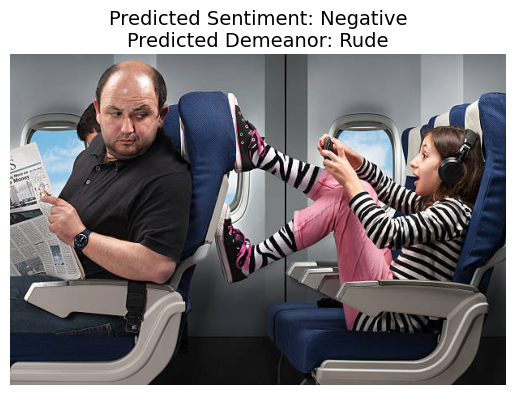

In [ ]:
test_models(sentiment_model, demeanor_model, file_path, sentiment_encoder, demeanor_encoder)

## Supportive

In [ ]:
file_path = "/content/drive/MyDrive/Images-Social-Demeanor/testing images/supportive.jpg",

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


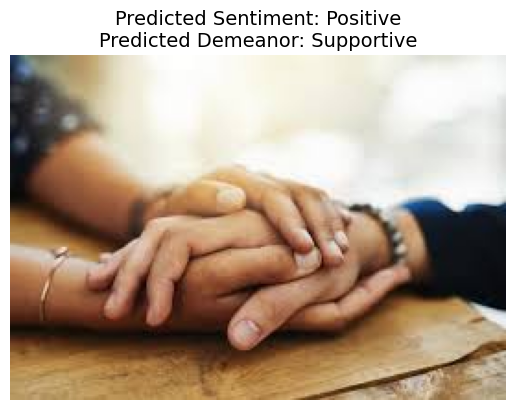

In [ ]:
test_models(sentiment_model, demeanor_model, file_path, sentiment_encoder, demeanor_encoder)

## Dismissive

In [ ]:
file_path = "/content/drive/MyDrive/Images-Social-Demeanor/testing images/dismissive.jpeg",

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step


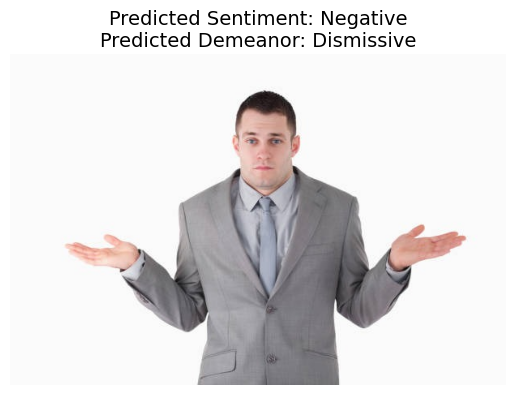

In [ ]:
test_models(sentiment_model, demeanor_model, file_path, sentiment_encoder, demeanor_encoder)

## friendly

In [ ]:
file_path = "/content/images.jpg",

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step


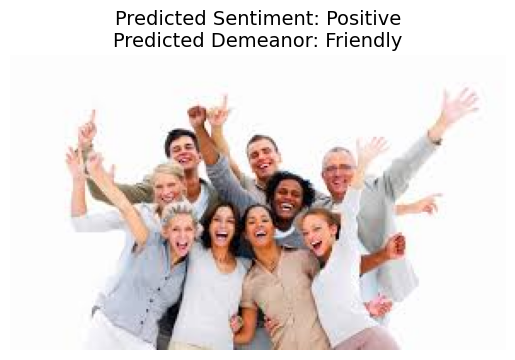

In [ ]:
test_models(sentiment_model, demeanor_model, file_path, sentiment_encoder, demeanor_encoder)

## Respectful


In [ ]:
file_path = "/content/images.jpg",

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


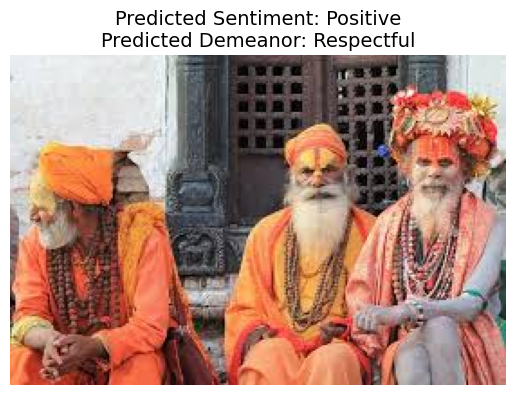

In [ ]:
test_models(sentiment_model, demeanor_model, file_path, sentiment_encoder, demeanor_encoder)

## Neutral

In [ ]:
file_path = "/content/download.jpg",

1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


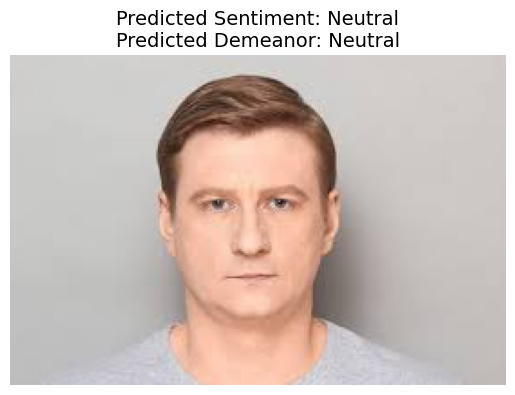

In [ ]:
test_models(sentiment_model, demeanor_model, file_path, sentiment_encoder, demeanor_encoder)

## Hostile

In [ ]:
file_path = "/content/download.jpg",

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


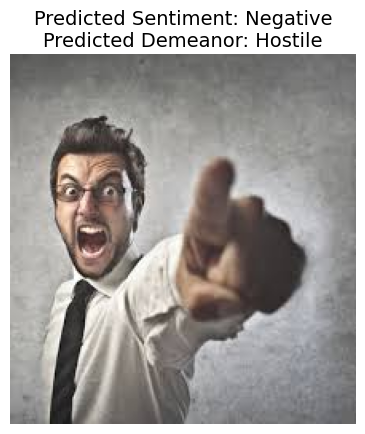

In [ ]:
test_models(sentiment_model, demeanor_model, file_path, sentiment_encoder, demeanor_encoder)